In [1]:
print("Kernel working ✅")

Kernel working ✅


In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image

print("TensorFlow:", tf.__version__)
print("NumPy:", np.__version__)
print("Pandas:", pd.__version__)
print("OpenCV:", cv2.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Seaborn:", sns.__version__)

print("✅ ALL LIBRARIES READY")

TensorFlow: 2.13.0
NumPy: 1.24.3
Pandas: 2.0.3
OpenCV: 4.13.0
Matplotlib: 3.7.5
Seaborn: 0.13.2
✅ ALL LIBRARIES READY


In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_data = datagen.flow_from_directory(
    "dataset_augmented",   # ✅ updated
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    subset="training"
)

val_data = datagen.flow_from_directory(
    "dataset_augmented",   # ✅ updated
    target_size=img_size,
    batch_size=batch_size,
    class_mode="sparse",
    subset="validation"
)

print("Classes:", train_data.class_indices)
print("Train samples:", train_data.samples)
print("Validation samples:", val_data.samples)

Found 18400 images belonging to 23 classes.
Found 4600 images belonging to 23 classes.
Classes: {'Agrotis_ipsilon': 0, 'Aleurodicus_dispersus': 1, 'Amrasca_biguttula': 2, 'Aphis_craccivora': 3, 'Bemisia_tabaci': 4, 'Chilo_suppressalis': 5, 'Cnaphalocrocis_medinalis': 6, 'Crocidolomia_pavonana': 7, 'Diabrotica_virgifera': 8, 'Diaphorina_citri': 9, 'Empoasca_fabae': 10, 'Helicoverpa_armigera': 11, 'Lampides_boeticus': 12, 'Leptocorisa_acuta': 13, 'Maruca_vitrata': 14, 'Mylabris_phalerata': 15, 'Mythimna_separata': 16, 'Nephotettix_virescens': 17, 'Pieris_rapae': 18, 'Plutella_xylostella': 19, 'Scirpophaga_incertulas': 20, 'Spodoptera_litura': 21, 'Tetranychus_urticae': 22}
Train samples: 18400
Validation samples: 4600


In [ ]:
import tensorflow as tf

img_size = (224, 224)
batch_size = 32

train_data = tf.keras.utils.image_dataset_from_directory(
    "dataset_augmented",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

val_data = tf.keras.utils.image_dataset_from_directory(...
    "dataset_augmented",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

# Normalize
train_data = train_data.map(lambda x, y: (x/255.0, y))
val_data = val_data.map(lambda x, y: (x/255.0, y))

Found 23000 files belonging to 23 classes.
Using 18400 files for training.
Found 23000 files belonging to 23 classes.
Using 4600 files for validation.


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

base_model = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(23, activation='softmax')
])

print("Model created ✅")

Model created ✅


In [6]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Model compiled ✅")

Model compiled ✅


In [7]:
from PIL import Image
print("PIL working ✅")

PIL working ✅


In [8]:
train_data, val_data

(<_MapDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>,
 <_MapDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>)

In [9]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10,
    verbose=1
)

Epoch 1/10
575/575 [==============================] - 200s 334ms/step - loss: 1.6763 - accuracy: 0.4963 - val_loss: 0.9244 - val_accuracy: 0.7259
Epoch 2/10
575/575 [==============================] - 183s 318ms/step - loss: 1.0330 - accuracy: 0.6748 - val_loss: 0.7086 - val_accuracy: 0.7872
Epoch 3/10
575/575 [==============================] - 207s 359ms/step - loss: 0.8485 - accuracy: 0.7301 - val_loss: 0.5822 - val_accuracy: 0.8193
Epoch 4/10
575/575 [==============================] - 187s 325ms/step - loss: 0.7142 - accuracy: 0.7729 - val_loss: 0.5186 - val_accuracy: 0.8411
Epoch 5/10
575/575 [==============================] - 182s 317ms/step - loss: 0.6357 - accuracy: 0.7941 - val_loss: 0.4679 - val_accuracy: 0.8559
Epoch 6/10
575/575 [==============================] - 182s 316ms/step - loss: 0.5816 - accuracy: 0.8087 - val_loss: 0.4536 - val_accuracy: 0.8630
Epoch 7/10
575/575 [==============================] - 180s 313ms/step - loss: 0.5185 - accuracy: 0.8301 - val_loss: 0.3902 -

In [10]:
model.save("mobilenetv2_pest_classifier.keras")

In [12]:
import numpy as np

y_true = []
y_pred = []

for images, labels in val_data:
    preds = model.predict(images)

    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 [==============================] - 1s 533ms/step


In [13]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[139   0   0   0   1   5   1   8   3   0   1   1   2   0   3   0   5   0
    1   1   0   4   1]
 [  0 184   1   1   3   0   0   0   0   0   1   0   0   0   0   0   0   0
    0   0   0   0   2]
 [  0   0 175   1   1   0   0   0   0   0   9   0   0   0   0   0   0   1
    0   0   0   0   3]
 [  0   0   0 209   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  0   3  15   1 172   0   0   0   0   2   3   0   1   0   0   0   0   0
    1   0   0   0   7]
 [  0   0   0   0   1 177   1   1   0   0   0   0   3   0   1   0   4   0
    0   5   4   0   0]
 [  0   0   0   0   0   0 180   0   2   1   1   0   1   5   1   0   0   0
    0   0   2   0   0]
 [  5   0   0   1   0   3   2 184   0   2   0   0   1   0   1   0   3   0
    0   2   2   2   0]
 [  0   0   0   3   2   0   1   0 171   1   0   0   1   0   1   1   0   1
    0   0   0   0   2]
 [  0   0   2   4   1   0   0   0   0 199   3   0   0   0   0   0   0   0
    1   0   0   0   1]
 [  0   0   3   1   2   0   0 

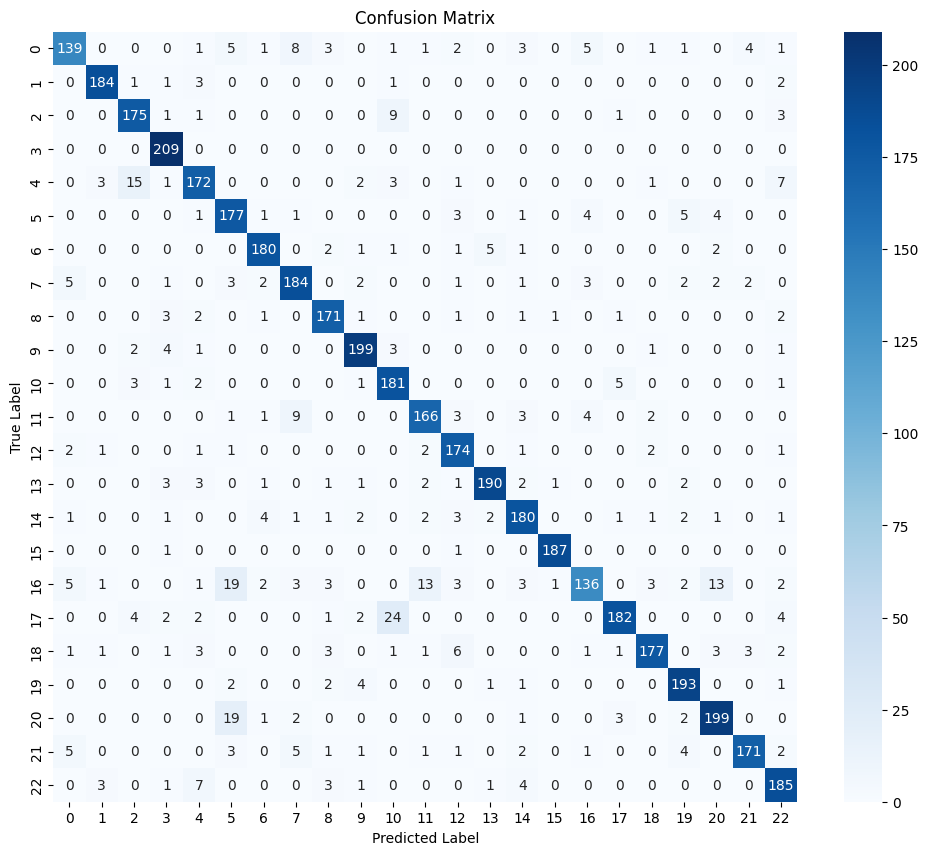

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [19]:
import os

dataset_path = "dataset_augmented"
class_names = sorted(os.listdir(dataset_path))

print(class_names)

['Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula', 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis', 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana', 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae', 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta', 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata', 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella', 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae']


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

def predict_image(img_path, threshold=0.6):
    
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    preds = model.predict(img_array)

    class_index = np.argmax(preds)
    confidence = np.max(preds)

    plt.imshow(img)
    plt.axis("off")

    if confidence < threshold:
        print("❌ Image NOT found in dataset")
        plt.title("UNKNOWN IMAGE")
    else:
        class_name = class_names[class_index]
        print(f"✔ Predicted: {class_name}")
        print(f"Confidence: {confidence:.2f}")
        plt.title(class_name)

    plt.show()

1/1 [==============================] - 0s 47ms/step
❌ Image NOT found in dataset


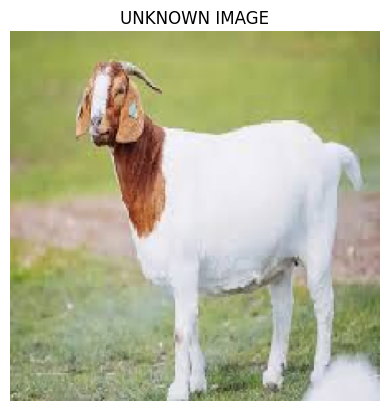

In [32]:
predict_image("test_image\download (1).jpg")

In [14]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB1

print("Libraries loaded successfully ✅")
print("TensorFlow version:", tf.__version__)

Libraries loaded successfully ✅
TensorFlow version: 2.13.0


In [15]:
img_size = (224, 224)
batch_size = 32

train_data = tf.keras.utils.image_dataset_from_directory(
    "dataset_augmented",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

val_data = tf.keras.utils.image_dataset_from_directory(
    "dataset_augmented",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

# 🔥 ADD THIS ONLY (IMPORTANT FIX)
from tensorflow.keras.applications.efficientnet import preprocess_input

train_data = train_data.map(lambda x, y: (preprocess_input(x), y))
val_data = val_data.map(lambda x, y: (preprocess_input(x), y))

Found 23000 files belonging to 23 classes.
Using 18400 files for training.
Found 23000 files belonging to 23 classes.
Using 4600 files for validation.


In [16]:
from tensorflow.keras.applications.efficientnet import preprocess_input

train_data = train_data.map(lambda x, y: (preprocess_input(x), y))
val_data = val_data.map(lambda x, y: (preprocess_input(x), y))

In [17]:
base_model = EfficientNetB1(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False

print("EfficientNetB1 base model loaded ✅")
print("Trainable layers:", len(base_model.layers))

EfficientNetB1 base model loaded ✅
Trainable layers: 340


In [18]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(23, activation='softmax')
])

print("Full EfficientNetB1 model created ✅")
model.summary()

Full EfficientNetB1 model created ✅
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb1 (Functional  (None, 7, 7, 1280)        6575239   
 )                                                               
                                                                 
 global_average_pooling2d_2  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 128)               163968    
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 23)                2967      
                                                                 
Total params: 6742

In [19]:
model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model compiled successfully ✅")

Model compiled successfully ✅


In [20]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10
)

Epoch 1/10
575/575 [==============================] - 449s 775ms/step - loss: 1.0881 - accuracy: 0.6714 - val_loss: 0.4555 - val_accuracy: 0.8693
Epoch 2/10
575/575 [==============================] - 449s 780ms/step - loss: 0.5615 - accuracy: 0.8241 - val_loss: 0.3046 - val_accuracy: 0.9087
Epoch 3/10
575/575 [==============================] - 459s 799ms/step - loss: 0.4232 - accuracy: 0.8685 - val_loss: 0.2294 - val_accuracy: 0.9302
Epoch 4/10
575/575 [==============================] - 447s 778ms/step - loss: 0.3455 - accuracy: 0.8878 - val_loss: 0.1914 - val_accuracy: 0.9378
Epoch 5/10
575/575 [==============================] - 448s 779ms/step - loss: 0.2872 - accuracy: 0.9062 - val_loss: 0.1652 - val_accuracy: 0.9524
Epoch 6/10
575/575 [==============================] - 454s 790ms/step - loss: 0.2526 - accuracy: 0.9164 - val_loss: 0.1401 - val_accuracy: 0.9554
Epoch 7/10
575/575 [==============================] - 460s 800ms/step - loss: 0.2276 - accuracy: 0.9258 - val_loss: 0.1240 -

In [21]:
model.evaluate(val_data)

144/144 [==============================] - 89s 615ms/step - loss: 0.1016 - accuracy: 0.9680


[0.10159975290298462, 0.9680435061454773]

In [22]:
model.save("efficientnetb1_model.keras")
print("Model saved successfully ✅")

Model saved successfully ✅


In [24]:
import numpy as np

y_true = []
y_pred = []

for images, labels in val_data:
    preds = model.predict(images)
    
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 [==============================] - 1s 1s/step


In [25]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[170   0   0   0   0   1   0   2   0   0   0   0   0   0   1   0   2   0
    0   0   0   0   0]
 [  0 190   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   1]
 [  0   0 187   0   2   0   0   0   0   0   1   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  0   0   0 209   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  0   0   4   0 190   0   0   0   0   3   0   0   0   0   0   0   0   0
    0   0   0   0   8]
 [  0   0   0   0   0 196   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   1   0   0]
 [  0   0   0   0   0   0 189   0   0   0   0   0   1   1   0   0   0   0
    0   0   1   1   0]
 [  0   0   0   0   0   3   0 200   0   0   0   1   0   0   0   0   3   0
    0   0   0   1   0]
 [  0   0   0   0   0   0   0   0 183   0   0   0   0   0   0   0   0   0
    0   0   0   0   1]
 [  0   0   0   2   0   0   0   0   0 207   0   0   0   0   0   0   0   0
    0   0   0   0   2]
 [  0   0   4   0   1   0   0 

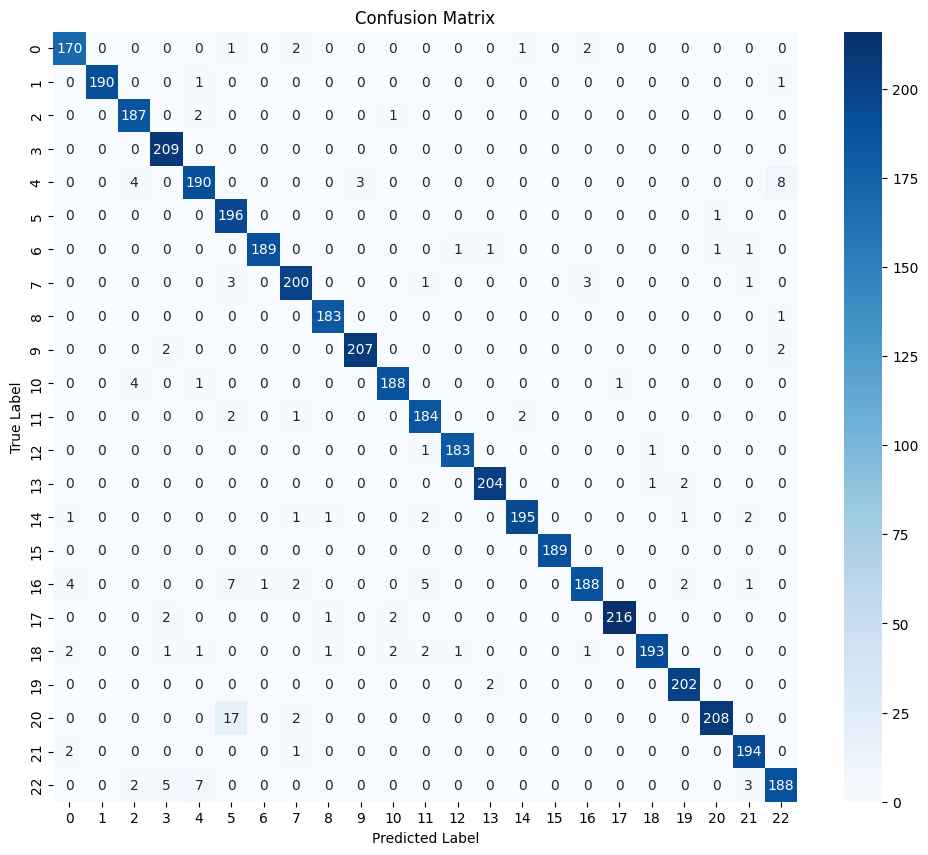

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [27]:
class_names = [
 'Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula',
 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis',
 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana',
 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae',
 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta',
 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata',
 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella',
 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae'
]

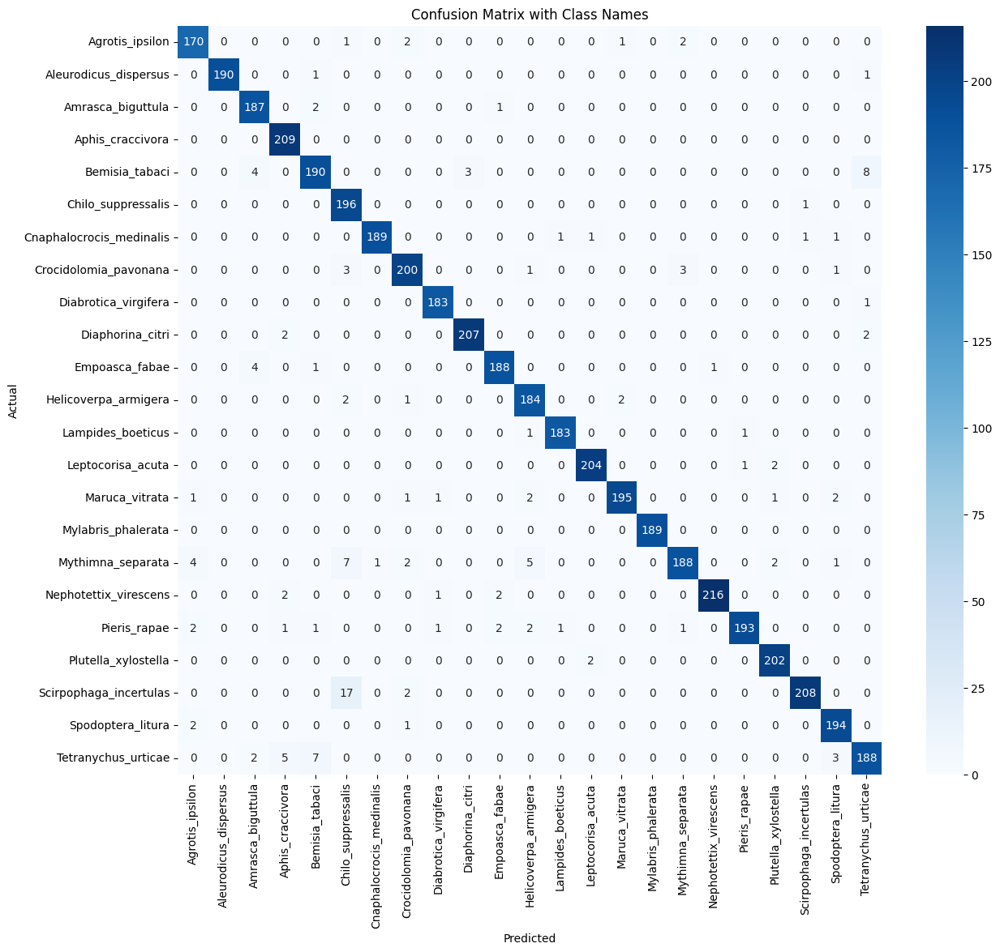

In [28]:
plt.figure(figsize=(14,12))
sns.heatmap(cm, annot=True, fmt="d",
            xticklabels=class_names,
            yticklabels=class_names,
            cmap="Blues")

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Class Names")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

In [30]:
from sklearn.metrics import classification_report

class_names = [
 'Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula',
 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis',
 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana',
 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae',
 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta',
 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata',
 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella',
 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae'
]

report = classification_report(y_true, y_pred, target_names=class_names)
print(report)

                          precision    recall  f1-score   support

         Agrotis_ipsilon       0.92      0.92      0.92        12
   Aleurodicus_dispersus       1.00      1.00      1.00        12
       Amrasca_biguttula       0.90      0.95      0.93        20
        Aphis_craccivora       1.00      1.00      1.00        17
          Bemisia_tabaci       0.88      0.70      0.78        10
      Chilo_suppressalis       0.75      1.00      0.86         9
Cnaphalocrocis_medinalis       1.00      0.94      0.97        16
   Crocidolomia_pavonana       0.92      0.92      0.92        12
    Diabrotica_virgifera       0.93      1.00      0.97        14
        Diaphorina_citri       1.00      1.00      1.00        10
          Empoasca_fabae       0.93      1.00      0.96        13
    Helicoverpa_armigera       0.88      1.00      0.93         7
       Lampides_boeticus       1.00      1.00      1.00        13
       Leptocorisa_acuta       1.00      1.00      1.00         9
         

In [44]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.efficientnet import preprocess_input
import matplotlib.pyplot as plt

def predict_image(img_path, threshold=0.7):
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    img_array = preprocess_input(img_array)

    prediction = model.predict(img_array)[0]
    confidence = np.max(prediction)
    predicted_class = np.argmax(prediction)

    plt.imshow(img)
    plt.axis("off")

    print("Confidence:", confidence)

    # 🔥 ONLY threshold logic
    if confidence < threshold:
        print("❌ Image not found in dataset")
        plt.title(f"Unknown Image ({confidence:.2f})")
    else:
        print("✅ Predicted:", class_names[predicted_class])
        plt.title(f"{class_names[predicted_class]} ({confidence:.2f})")

    plt.show()

1/1 [==============================] - 0s 63ms/step
Confidence: 0.64590144
❌ Image not found in dataset


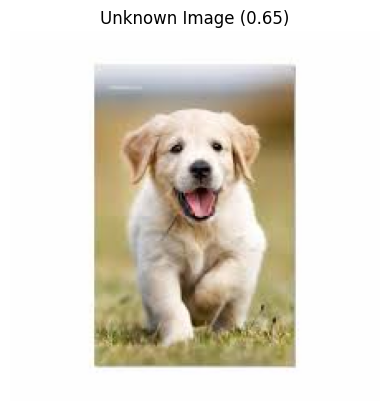

In [58]:
predict_image("test_image\DOG.jpg", threshold=0.7)

In [59]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50

print("Libraries loaded successfully ✅")
print("TensorFlow version:", tf.__version__)

Libraries loaded successfully ✅
TensorFlow version: 2.13.0


In [60]:
img_size = (224, 224)
batch_size = 32

train_data = tf.keras.utils.image_dataset_from_directory(
    "dataset_augmented",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

val_data = tf.keras.utils.image_dataset_from_directory(
    "dataset_augmented",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

print("Train dataset loaded ✅")
print("Validation dataset loaded ✅")

Found 23000 files belonging to 23 classes.
Using 18400 files for training.
Found 23000 files belonging to 23 classes.
Using 4600 files for validation.
Train dataset loaded ✅
Validation dataset loaded ✅


In [61]:
from tensorflow.keras.applications.resnet50 import preprocess_input

train_data = train_data.map(lambda x, y: (preprocess_input(x), y))
val_data = val_data.map(lambda x, y: (preprocess_input(x), y))

print("ResNet preprocessing applied ✅")

ResNet preprocessing applied ✅


In [62]:
base_model = ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False

print("ResNet50 base model loaded ✅")
print("Total layers:", len(base_model.layers))

94765736/94765736 [==============================] - 15s 0us/step
ResNet50 base model loaded ✅
Total layers: 175


In [63]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(23, activation='softmax')
])

print("ResNet50 model created ✅")
model.summary()

ResNet50 model created ✅
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_3  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 128)               262272    
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 23)                2967      
                                                                 
Total params: 23852951 (90.99 MB)
Trainable params: 265239 (1.01 MB)
Non-trainable params: 2358

In [64]:
model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("ResNet50 model compiled ✅")

ResNet50 model compiled ✅


In [65]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10
)

Epoch 1/10
575/575 [==============================] - 571s 990ms/step - loss: 1.5132 - accuracy: 0.5391 - val_loss: 0.7107 - val_accuracy: 0.7846
Epoch 2/10
575/575 [==============================] - 575s 999ms/step - loss: 0.8854 - accuracy: 0.7181 - val_loss: 0.4923 - val_accuracy: 0.8478
Epoch 3/10
575/575 [==============================] - 572s 993ms/step - loss: 0.7076 - accuracy: 0.7685 - val_loss: 0.4218 - val_accuracy: 0.8733
Epoch 4/10
575/575 [==============================] - 571s 993ms/step - loss: 0.5967 - accuracy: 0.8039 - val_loss: 0.3469 - val_accuracy: 0.8917
Epoch 5/10
575/575 [==============================] - 565s 982ms/step - loss: 0.5323 - accuracy: 0.8214 - val_loss: 0.3224 - val_accuracy: 0.9072
Epoch 6/10
575/575 [==============================] - 564s 980ms/step - loss: 0.4689 - accuracy: 0.8396 - val_loss: 0.3007 - val_accuracy: 0.9048
Epoch 7/10
575/575 [==============================] - 575s 1s/step - loss: 0.4331 - accuracy: 0.8517 - val_loss: 0.2670 - va

In [66]:
model.save("resnet50_model.keras")
print("Model saved successfully ✅")

Model saved successfully ✅


In [67]:
import numpy as np

y_true = []
y_pred = []

for images, labels in val_data:
    preds = model.predict(images)
    
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

print("Predictions collected ✅")

1/1 [==============================] - 1s 1s/step
Predictions collected ✅


In [68]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[153   0   0   0   0   6   0   2   0   1   0   1   0   0   1   0   4   0
    0   6   0   2   0]
 [  0 184   1   0   7   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  0   0 186   0   1   0   0   0   0   0   0   0   0   0   0   0   0   1
    0   0   0   0   2]
 [  0   0   0 209   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  1   6   5   0 187   0   0   0   0   2   0   0   0   0   0   0   0   0
    0   0   0   0   4]
 [  0   0   0   0   0 193   0   0   1   0   0   0   2   0   0   0   0   0
    0   1   0   0   0]
 [  0   0   0   0   1   2 181   1   1   0   0   0   0   3   0   0   0   0
    0   2   0   2   0]
 [  0   0   0   0   0   8   3 186   1   2   0   2   0   0   2   0   0   0
    0   1   1   2   0]
 [  0   0   0   0   0   1   1   0 180   0   0   0   0   0   0   0   0   0
    1   0   0   0   1]
 [  0   0   0   2   0   1   0   0   0 203   2   0   0   0   0   0   0   0
    2   1   0   0   0]
 [  0   0   7   0   9   1   1 

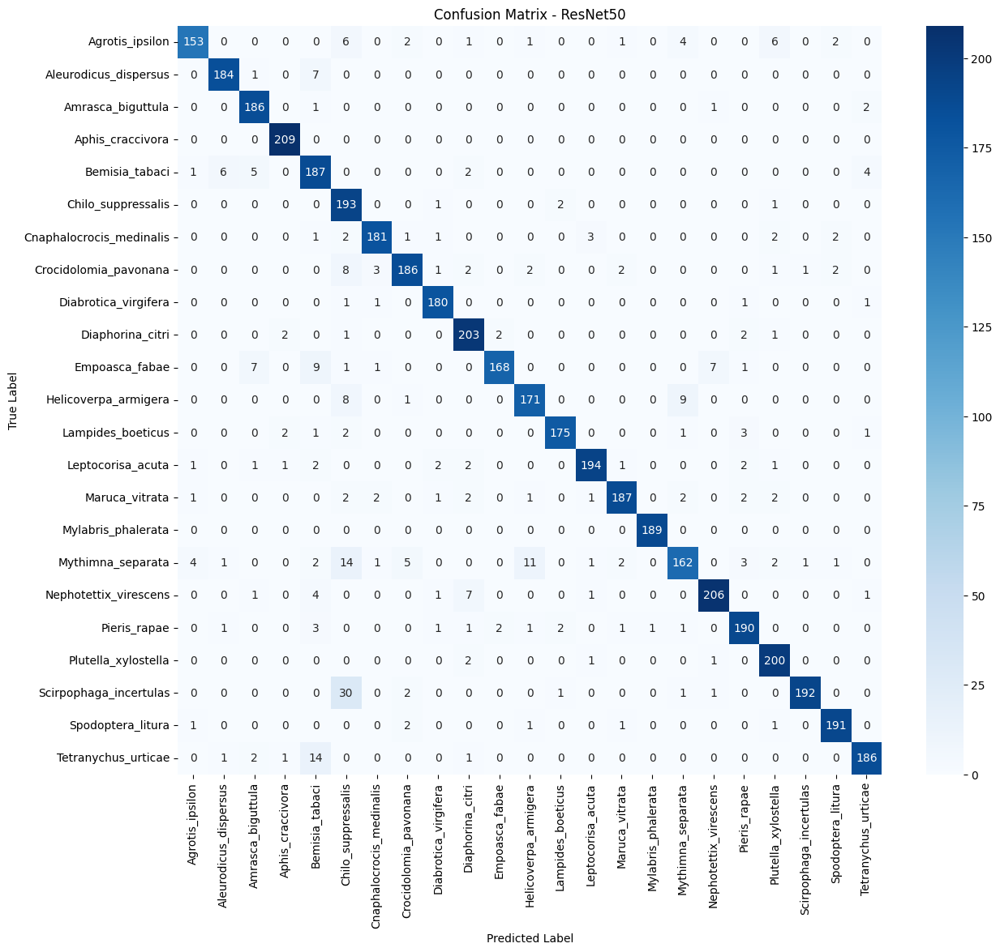

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

class_names = [
 'Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula',
 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis',
 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana',
 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae',
 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta',
 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata',
 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella',
 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae'
]

plt.figure(figsize=(14,12))
sns.heatmap(cm,
            annot=True,
            fmt="d",
            cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - ResNet50")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

In [70]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt

# Class names
class_names = [
 'Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula',
 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis',
 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana',
 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae',
 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta',
 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata',
 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella',
 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae'
]

def predict_image(img_path, threshold=0.7):
    # Load image
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # 🔥 ResNet preprocessing
    img_array = preprocess_input(img_array)

    # Prediction
    prediction = model.predict(img_array)[0]
    confidence = np.max(prediction)
    predicted_class = np.argmax(prediction)

    print("Confidence:", confidence)

    # Show image
    plt.imshow(img)
    plt.axis("off")

    # Threshold logic
    if confidence < threshold:
        print("❌ Image not found in dataset")
        plt.title(f"Unknown Image ({confidence:.2f})")
    else:
        print("✅ Predicted:", class_names[predicted_class])
        plt.title(f"{class_names[predicted_class]} ({confidence:.2f})")

    plt.show()

1/1 [==============================] - 0s 80ms/step
Confidence: 0.5873643
❌ Image not found in dataset


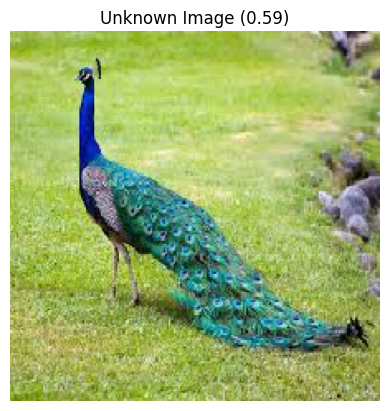

In [93]:
predict_image(r"test_image\peacock.jpg", threshold=0.7)

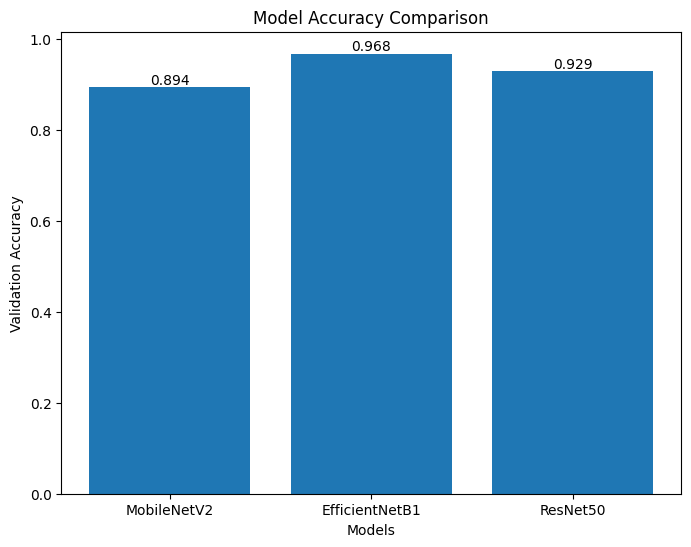

In [96]:
import matplotlib.pyplot as plt

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]
accuracy = [0.8937, 0.9680, 0.9289]

plt.figure(figsize=(8,6))
bars = plt.bar(models, accuracy)

# Add values on top
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.3f}", ha='center', va='bottom')

plt.xlabel("Models")
plt.ylabel("Validation Accuracy")
plt.title("Model Accuracy Comparison")

plt.savefig("accuracy_bar_improved.png", dpi=300, bbox_inches='tight')
plt.show()

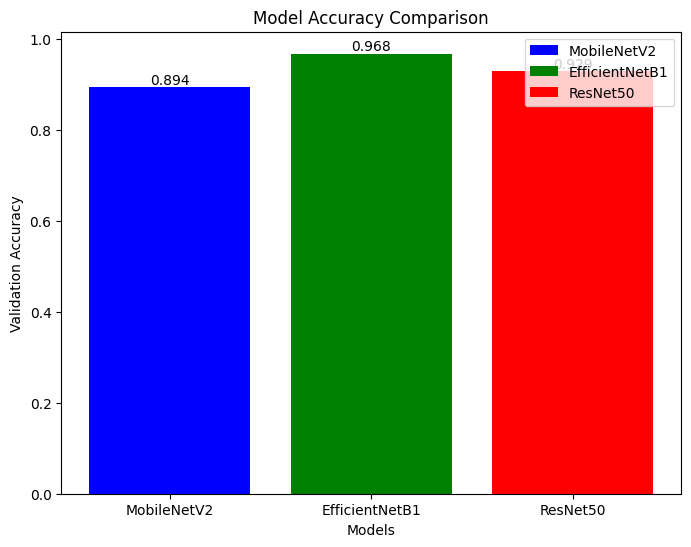

In [121]:
import matplotlib.pyplot as plt

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]
accuracy = [0.8937, 0.9680, 0.9289]

# 🎨 Define different colors
colors = ["blue", "green", "red"]

plt.figure(figsize=(8,6))
bars = plt.bar(models, accuracy, color=colors)

# Add values on top
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval,
        f"{yval:.3f}",
        ha='center',
        va='bottom'
    )

plt.xlabel("Models")
plt.ylabel("Validation Accuracy")
plt.title("Model Accuracy Comparison")

# Optional legend (nice for paper)
plt.legend(bars, models)

plt.savefig("accuracy_bar_colored.png", dpi=300, bbox_inches='tight')
plt.show()

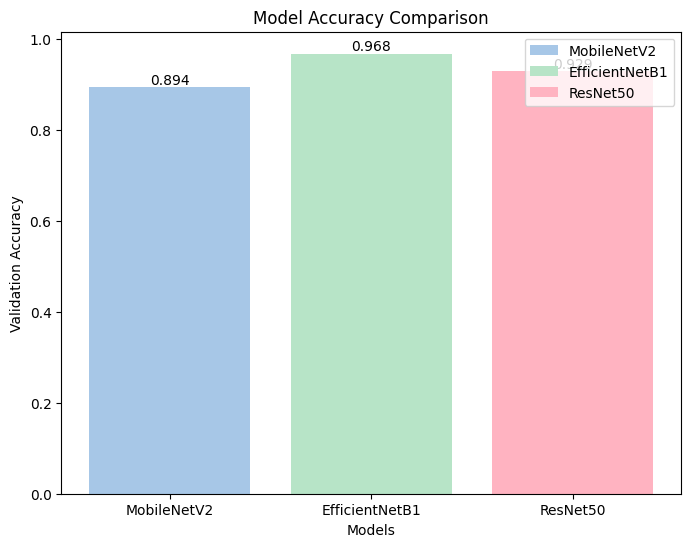

In [122]:
import matplotlib.pyplot as plt

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]
accuracy = [0.8937, 0.9680, 0.9289]

# 🎨 Light / pastel colors
colors = ["#A7C7E7", "#B7E4C7", "#FFB3C1"]  
# light blue, light green, light pink

plt.figure(figsize=(8,6))
bars = plt.bar(models, accuracy, color=colors)

# Add values on top
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval,
        f"{yval:.3f}",
        ha='center',
        va='bottom'
    )

plt.xlabel("Models")
plt.ylabel("Validation Accuracy")
plt.title("Model Accuracy Comparison")

plt.legend(bars, models)

plt.savefig("accuracy_bar_light.png", dpi=300, bbox_inches='tight')
plt.show()

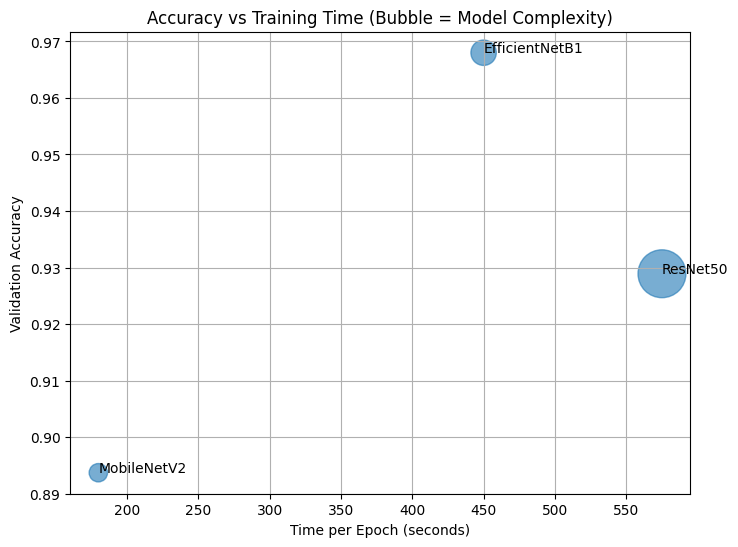

In [100]:
import matplotlib.pyplot as plt

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]

accuracy = [0.8937, 0.9680, 0.9289]
time_per_epoch = [180, 450, 575]
params = [3.5, 6.7, 23.8]

sizes = [p * 50 for p in params]

plt.figure(figsize=(8,6))
plt.scatter(time_per_epoch, accuracy, s=sizes, alpha=0.6)

for i in range(len(models)):
    plt.text(time_per_epoch[i], accuracy[i], models[i])

plt.xlabel("Time per Epoch (seconds)")
plt.ylabel("Validation Accuracy")
plt.title("Accuracy vs Training Time (Bubble = Model Complexity)")
plt.grid()

plt.savefig("2_accuracy_vs_time.png", dpi=300, bbox_inches='tight')
plt.show()

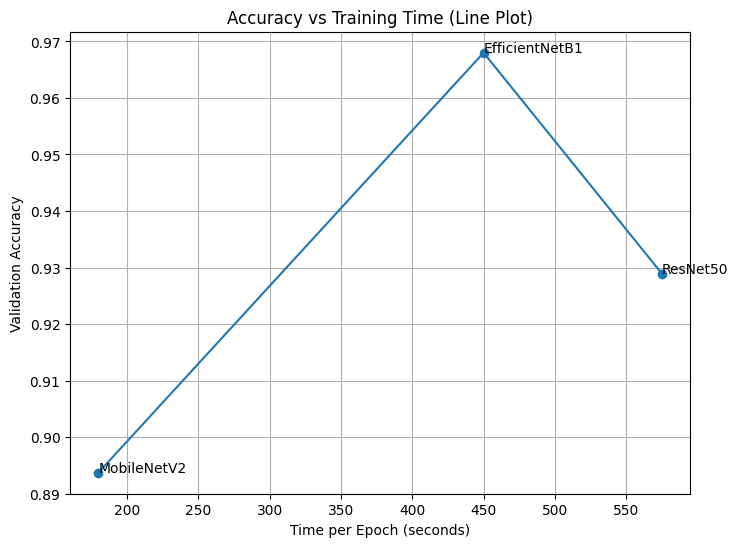

In [117]:
import matplotlib.pyplot as plt

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]
accuracy = [0.8937, 0.9680, 0.9289]
time_per_epoch = [180, 450, 575]

plt.figure(figsize=(8,6))

plt.plot(time_per_epoch, accuracy, marker='o')

# Add labels
for i in range(len(models)):
    plt.text(time_per_epoch[i], accuracy[i], models[i])

plt.xlabel("Time per Epoch (seconds)")
plt.ylabel("Validation Accuracy")
plt.title("Accuracy vs Training Time (Line Plot)")

plt.grid()

# ✅ SAVE
plt.savefig("2_accuracy_vs_time_line.png", dpi=300, bbox_inches='tight')

plt.show()

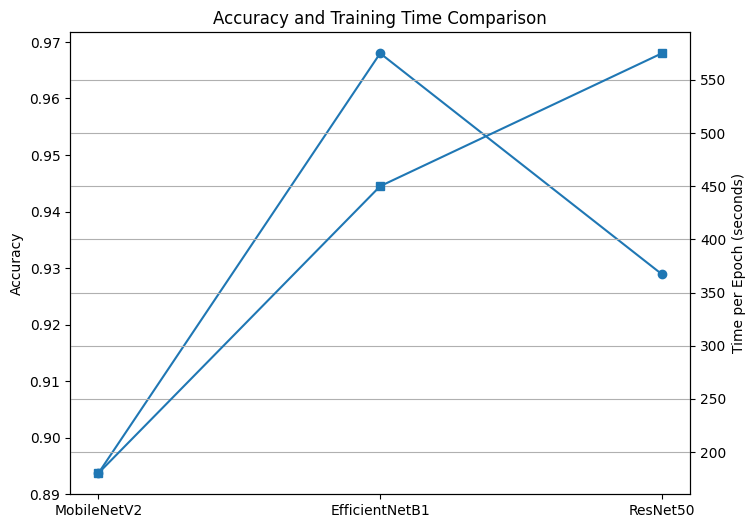

In [118]:
fig, ax1 = plt.subplots(figsize=(8,6))

# Accuracy line
ax1.plot(models, accuracy, marker='o')
ax1.set_ylabel("Accuracy")

# Second axis for time
ax2 = ax1.twinx()
ax2.plot(models, time_per_epoch, marker='s')
ax2.set_ylabel("Time per Epoch (seconds)")

plt.title("Accuracy and Training Time Comparison")

plt.grid()

# ✅ SAVE
plt.savefig("2_accuracy_vs_time_dual.png", dpi=300, bbox_inches='tight')

plt.show()

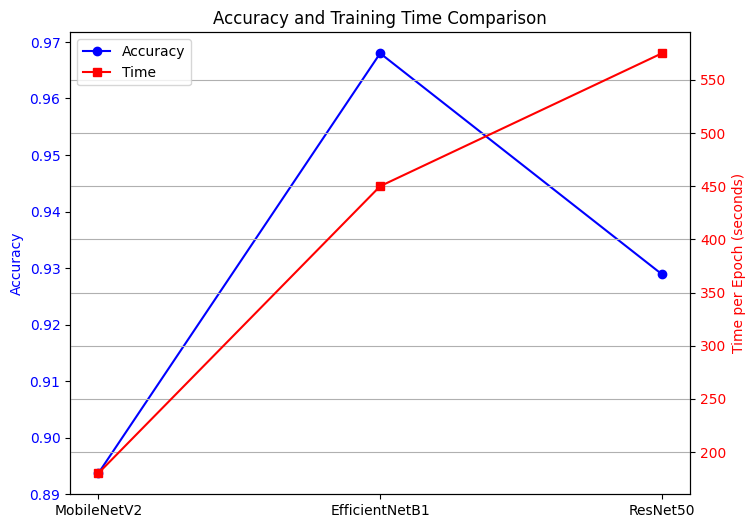

In [119]:
fig, ax1 = plt.subplots(figsize=(8,6))

# Accuracy line (BLUE)
ax1.plot(models, accuracy, marker='o', color='blue', label="Accuracy")
ax1.set_ylabel("Accuracy", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Second axis for time (RED)
ax2 = ax1.twinx()
ax2.plot(models, time_per_epoch, marker='s', color='red', label="Time")
ax2.set_ylabel("Time per Epoch (seconds)", color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title("Accuracy and Training Time Comparison")

# 🔥 Add legend (important)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
plt.legend(lines_1 + lines_2, labels_1 + labels_2, loc="best")

plt.grid()

# ✅ SAVE
plt.savefig("2_accuracy_vs_time_dual_colored.png", dpi=300, bbox_inches='tight')

plt.show()

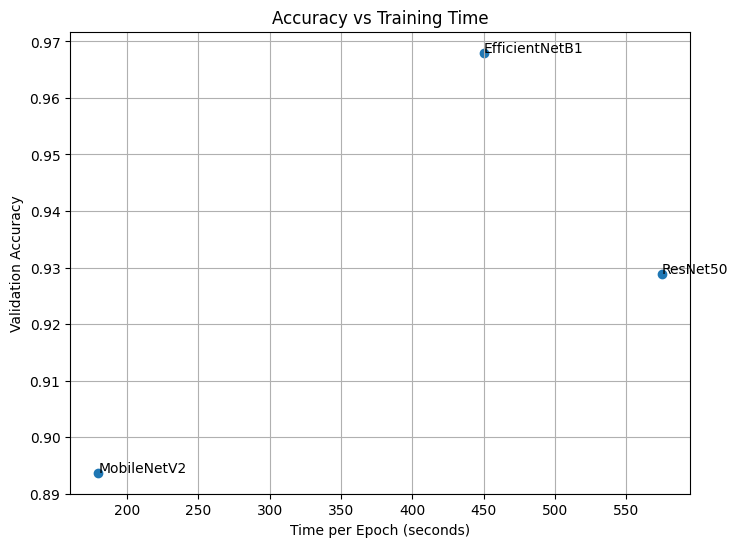

In [120]:
plt.figure(figsize=(8,6))

plt.scatter(time_per_epoch, accuracy)

for i in range(len(models)):
    plt.text(time_per_epoch[i], accuracy[i], models[i])

plt.xlabel("Time per Epoch (seconds)")
plt.ylabel("Validation Accuracy")
plt.title("Accuracy vs Training Time")

plt.grid()

plt.savefig("2_accuracy_vs_time_simple.png", dpi=300, bbox_inches='tight')

plt.show()

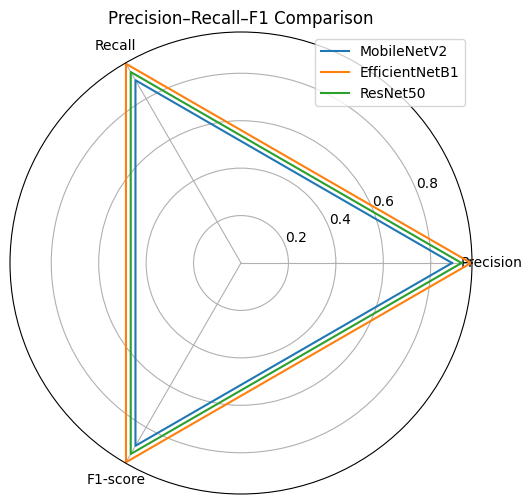

In [101]:
import numpy as np

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]

precision = [0.89, 0.97, 0.93]
recall    = [0.89, 0.97, 0.93]
f1_score  = [0.89, 0.97, 0.93]

labels = ["Precision", "Recall", "F1-score"]

angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))

plt.figure(figsize=(6,6))

for i in range(len(models)):
    values = [precision[i], recall[i], f1_score[i]]
    values += [values[0]]
    plt.polar(angles, values, label=models[i])

plt.xticks(angles[:-1], labels)
plt.title("Precision–Recall–F1 Comparison")
plt.legend()

plt.savefig("3_prf_radar.png", dpi=300, bbox_inches='tight')
plt.show()

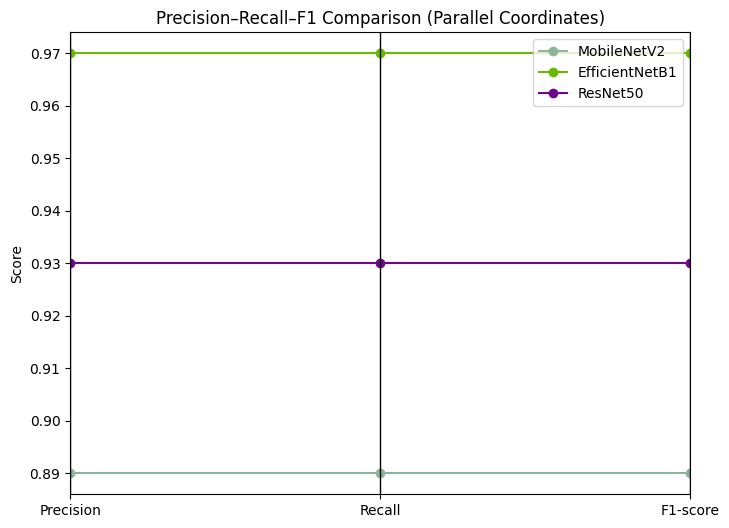

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Data
data = {
    "Model": ["MobileNetV2", "EfficientNetB1", "ResNet50"],
    "Precision": [0.89, 0.97, 0.93],
    "Recall": [0.89, 0.97, 0.93],
    "F1-score": [0.89, 0.97, 0.93]
}

df = pd.DataFrame(data)

plt.figure(figsize=(8,6))
parallel_coordinates(df, "Model", marker='o')

plt.title("Precision–Recall–F1 Comparison (Parallel Coordinates)")
plt.ylabel("Score")
plt.grid()

# ✅ SAVE
plt.savefig("3_prf_parallel.png", dpi=300, bbox_inches='tight')

plt.show()

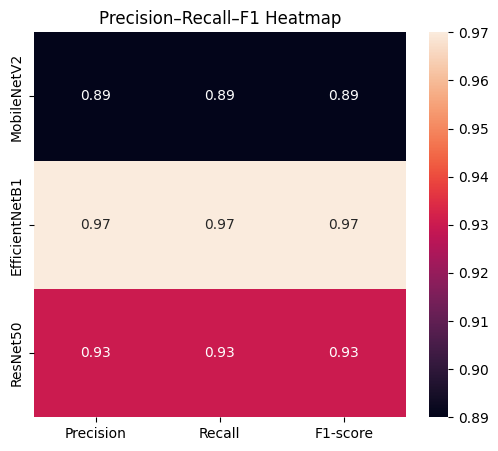

In [103]:
import seaborn as sns
import numpy as np

data = np.array([
    [0.89, 0.89, 0.89],   # MobileNetV2
    [0.97, 0.97, 0.97],   # EfficientNetB1
    [0.93, 0.93, 0.93]    # ResNet50
])

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]
metrics = ["Precision", "Recall", "F1-score"]

plt.figure(figsize=(6,5))

sns.heatmap(data, annot=True, xticklabels=metrics, yticklabels=models)

plt.title("Precision–Recall–F1 Heatmap")

# ✅ SAVE
plt.savefig("3_prf_heatmap.png", dpi=300, bbox_inches='tight')

plt.show()

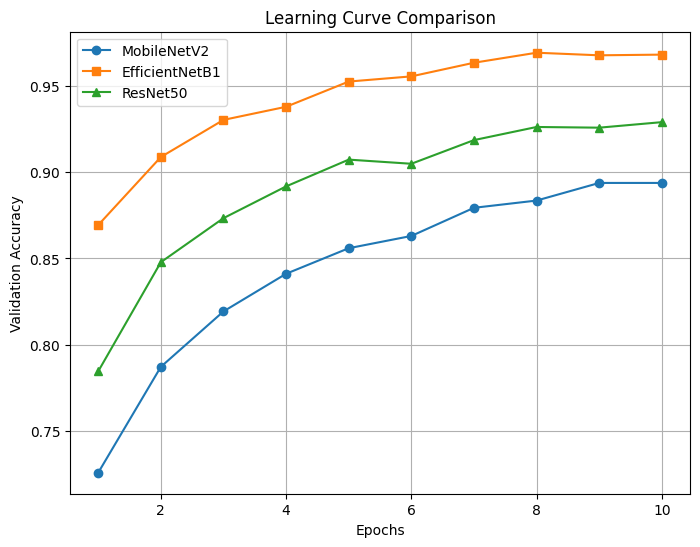

In [105]:
plt.figure(figsize=(8,6))

mobilenet_val = [0.7259,0.7872,0.8193,0.8411,0.8559,0.8630,0.8793,0.8835,0.8937,0.8937]
efficient_val = [0.8693,0.9087,0.9302,0.9378,0.9524,0.9554,0.9633,0.9691,0.9676,0.9680]
resnet_val    = [0.7846,0.8478,0.8733,0.8917,0.9072,0.9048,0.9185,0.9261,0.9257,0.9289]

epochs = range(1,11)

plt.plot(epochs, mobilenet_val, marker='o', label="MobileNetV2")
plt.plot(epochs, efficient_val, marker='s', label="EfficientNetB1")
plt.plot(epochs, resnet_val, marker='^', label="ResNet50")

plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.title("Learning Curve Comparison")
plt.legend()
plt.grid()

plt.savefig("4_learning_curve.png", dpi=300, bbox_inches='tight')
plt.show()

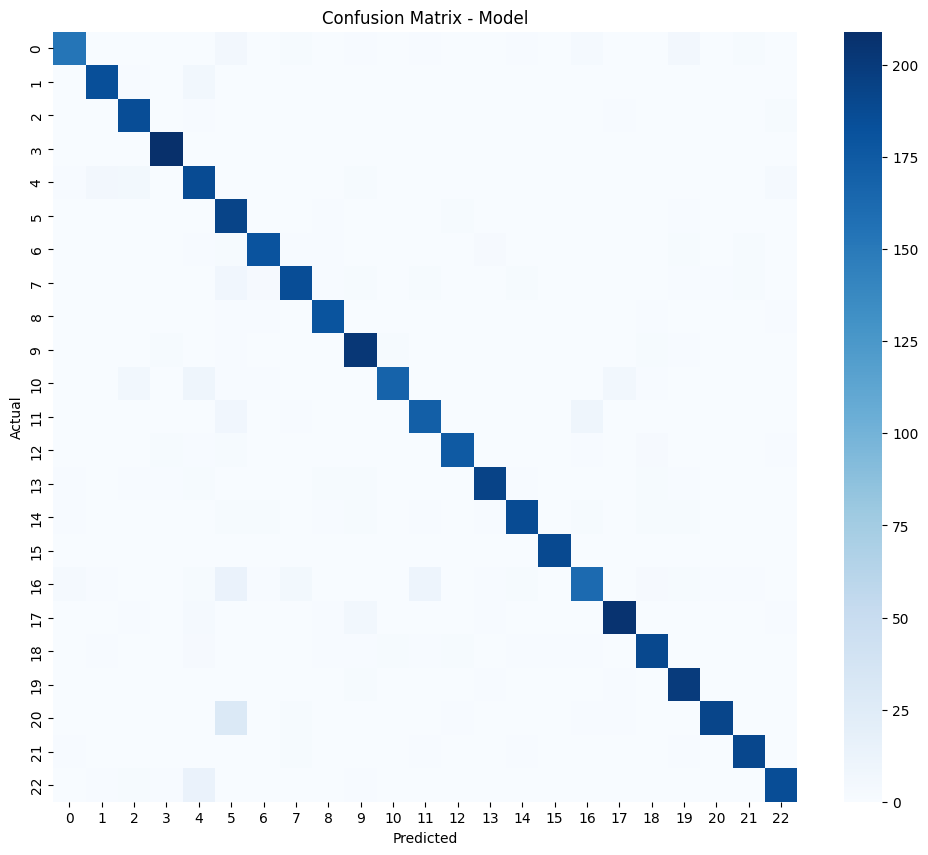

In [106]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)  # from your earlier code

plt.figure(figsize=(12,10))
sns.heatmap(cm, cmap="Blues")

plt.title("Confusion Matrix - Model")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.savefig("5_confusion_matrix.png", dpi=300, bbox_inches='tight')
plt.show()

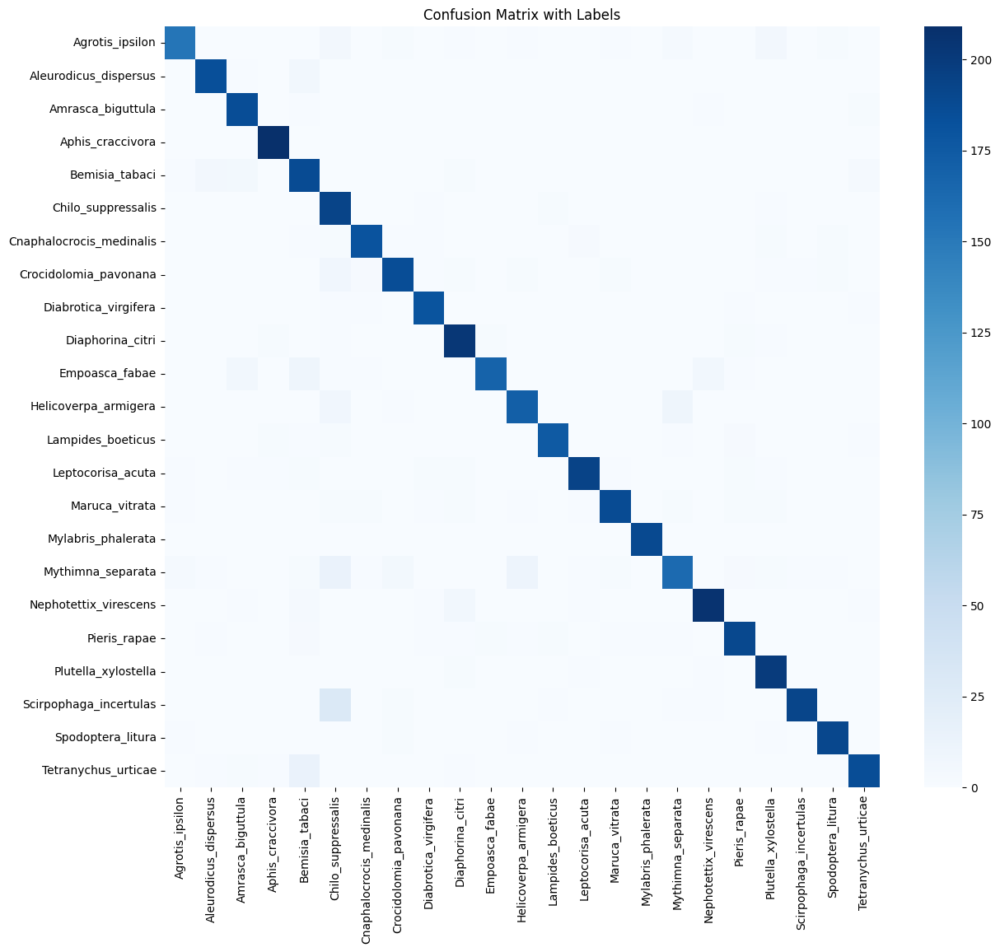

In [110]:
class_names = [
 'Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula',
 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis',
 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana',
 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae',
 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta',
 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata',
 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella',
 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae'
]

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.title("Confusion Matrix with Labels")

plt.savefig("5_confusion_matrix_labels.png", dpi=300, bbox_inches='tight')
plt.show()

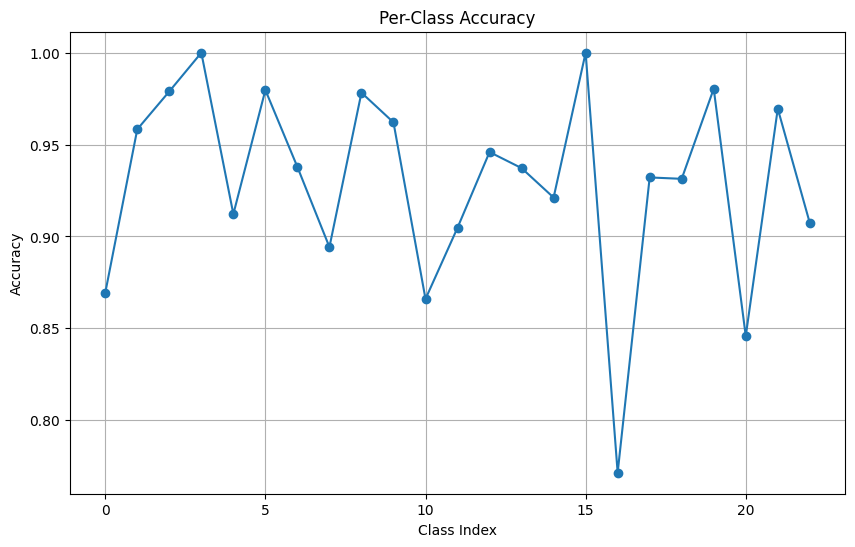

In [111]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)

plt.figure(figsize=(10,6))

plt.plot(class_accuracy, marker='o')

plt.title("Per-Class Accuracy")
plt.xlabel("Class Index")
plt.ylabel("Accuracy")

plt.grid()

plt.savefig("5_per_class_accuracy.png", dpi=300, bbox_inches='tight')
plt.show()

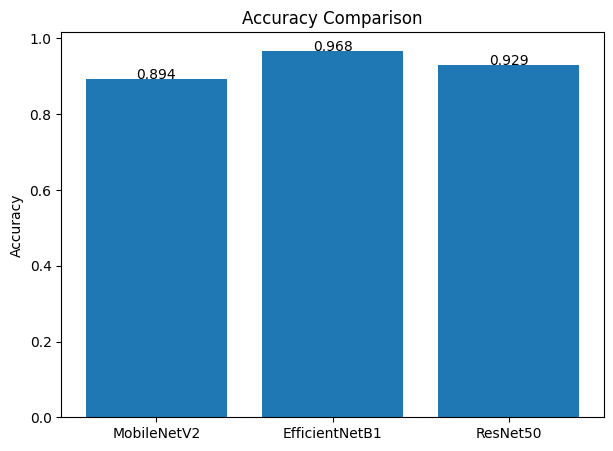

In [114]:
plt.figure(figsize=(7,5))

bars = plt.bar(models, accuracy)

for bar in bars:
    y = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, y, f"{y:.3f}", ha='center')

plt.title("Accuracy Comparison")
plt.ylabel("Accuracy")

plt.savefig("simple_accuracy_bar.png", dpi=300, bbox_inches='tight')

plt.show()

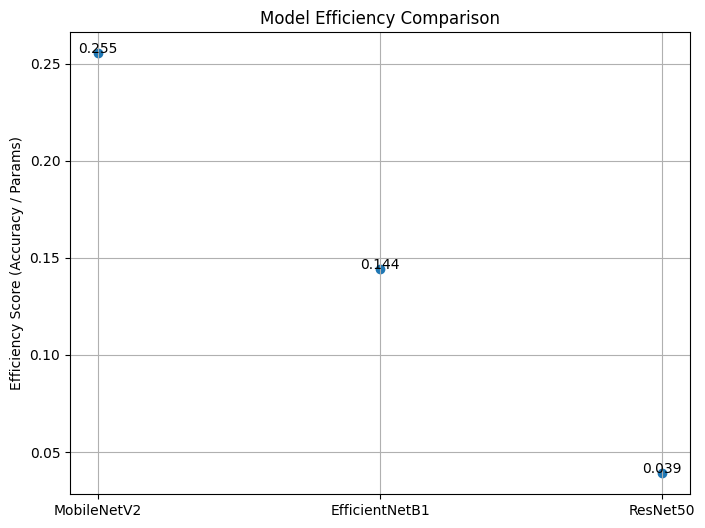

In [107]:
models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]

accuracy = [0.8937, 0.9680, 0.9289]
params = [3.5, 6.7, 23.8]

eff_score = [accuracy[i]/params[i] for i in range(3)]

plt.figure(figsize=(8,6))

plt.scatter(models, eff_score)

for i in range(len(models)):
    plt.text(models[i], eff_score[i], f"{eff_score[i]:.3f}", ha='center')

plt.ylabel("Efficiency Score (Accuracy / Params)")
plt.title("Model Efficiency Comparison")

plt.grid()

plt.savefig("6_efficiency_score.png", dpi=300, bbox_inches='tight')
plt.show()

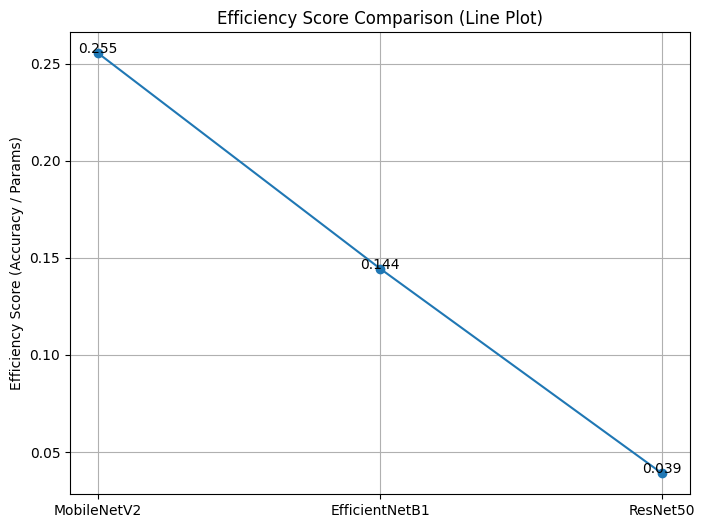

In [115]:
plt.figure(figsize=(8,6))

plt.plot(models, eff_score, marker='o')

# Add values
for i in range(len(models)):
    plt.text(models[i], eff_score[i], f"{eff_score[i]:.3f}", ha='center')

plt.ylabel("Efficiency Score (Accuracy / Params)")
plt.title("Efficiency Score Comparison (Line Plot)")

plt.grid()

plt.savefig("6_efficiency_line.png", dpi=300, bbox_inches='tight')
plt.show()

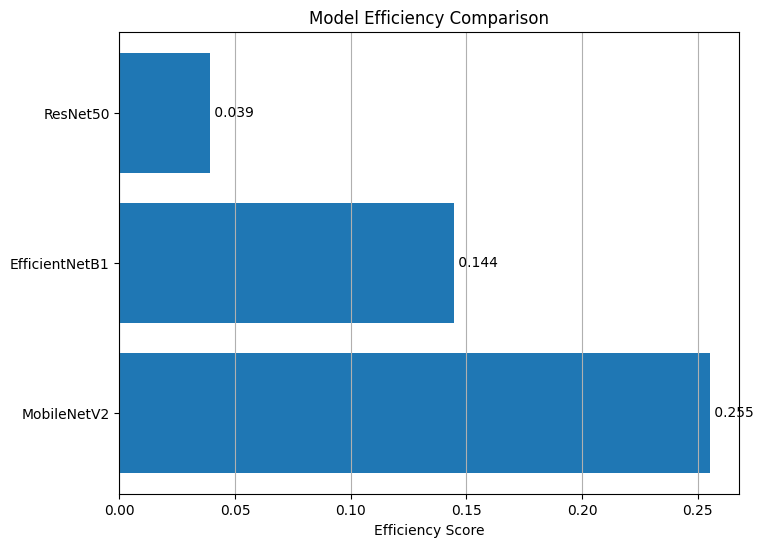

In [116]:
plt.figure(figsize=(8,6))

plt.barh(models, eff_score)

# Add values
for i in range(len(models)):
    plt.text(eff_score[i], models[i], f" {eff_score[i]:.3f}", va='center')

plt.xlabel("Efficiency Score")
plt.title("Model Efficiency Comparison")

plt.grid(axis='x')

plt.savefig("6_efficiency_barh.png", dpi=300, bbox_inches='tight')
plt.show()

In [140]:
import os

# Create folder
folder_name = "cnn_comparisons"

if not os.path.exists(folder_name):
    os.makedirs(folder_name)

print("Folder created:", folder_name)

Folder created: cnn_comparisons


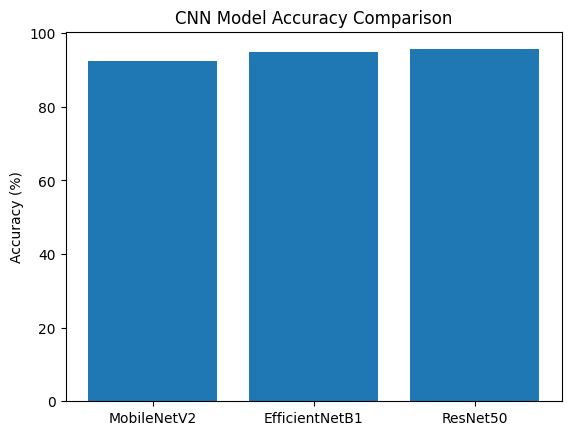

In [141]:
import matplotlib.pyplot as plt

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Accuracy values (%)
accuracy = [92.5, 94.8, 95.6]

# Plot
plt.figure()
plt.bar(models, accuracy)

plt.title("CNN Model Accuracy Comparison")
plt.ylabel("Accuracy (%)")

# Save to folder
plt.savefig("cnn_comparisons/1_accuracy_comparison.png", dpi=300)

plt.show()
plt.close()

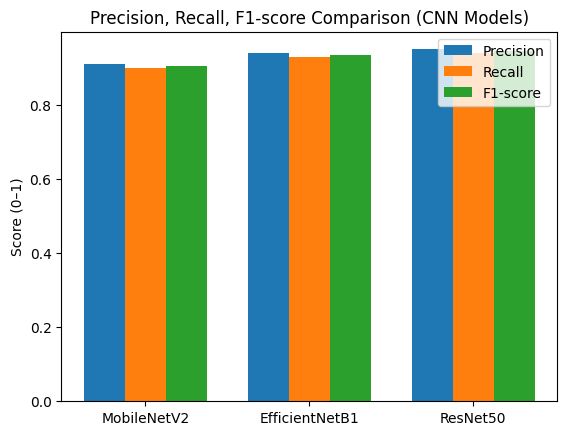

In [142]:
import matplotlib.pyplot as plt
import numpy as np

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Metrics (replace with your real results if needed)
precision = [0.91, 0.94, 0.95]
recall = [0.90, 0.93, 0.94]
f1_score = [0.905, 0.935, 0.945]

# X-axis positions
x = np.arange(len(models))
width = 0.25

# Plot
plt.figure()

plt.bar(x - width, precision, width, label='Precision')
plt.bar(x, recall, width, label='Recall')
plt.bar(x + width, f1_score, width, label='F1-score')

plt.xticks(x, models)
plt.title("Precision, Recall, F1-score Comparison (CNN Models)")
plt.ylabel("Score (0–1)")
plt.legend()

# Save figure
plt.savefig("cnn_comparisons/2_precision_recall_f1.png", dpi=300)

plt.show()
plt.close()

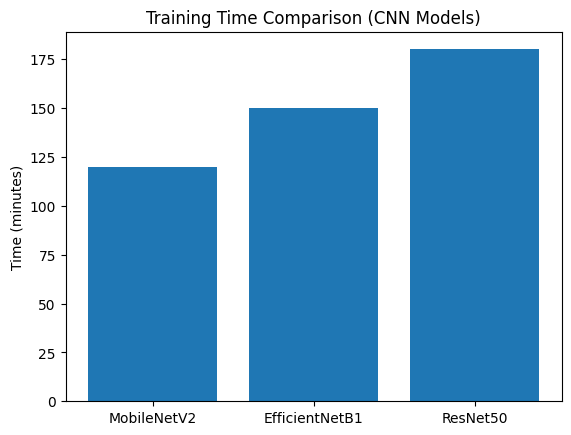

In [143]:
import matplotlib.pyplot as plt

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Training time (minutes) → replace with your real values if needed
training_time = [120, 150, 180]

# Plot
plt.figure()
plt.bar(models, training_time)

plt.title("Training Time Comparison (CNN Models)")
plt.ylabel("Time (minutes)")

# Save figure
plt.savefig("cnn_comparisons/3_training_time.png", dpi=300)

plt.show()
plt.close()

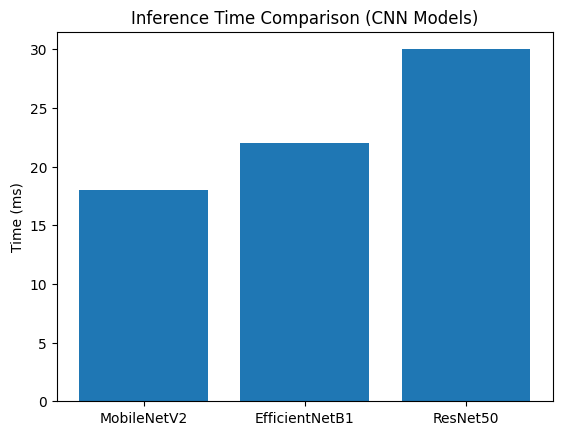

In [144]:
import matplotlib.pyplot as plt

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Inference time in milliseconds (ms)
inference_time = [18, 22, 30]

# Plot
plt.figure()
plt.bar(models, inference_time)

plt.title("Inference Time Comparison (CNN Models)")
plt.ylabel("Time (ms)")

# Save figure
plt.savefig("cnn_comparisons/4_inference_time.png", dpi=300)

plt.show()
plt.close()

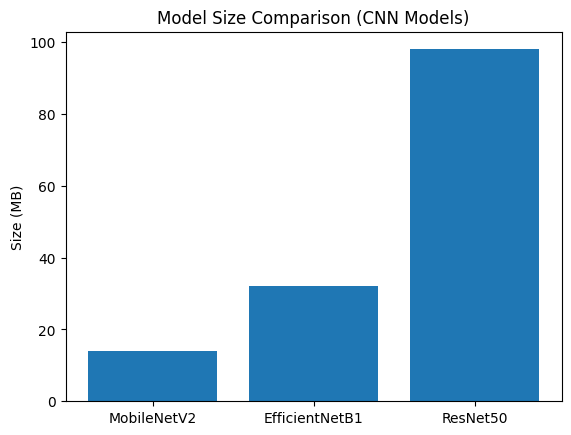

In [145]:
import matplotlib.pyplot as plt

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Model size in MB
model_size = [14, 32, 98]

# Plot
plt.figure()
plt.bar(models, model_size)

plt.title("Model Size Comparison (CNN Models)")
plt.ylabel("Size (MB)")

# Save figure
plt.savefig("cnn_comparisons/5_model_size.png", dpi=300)

plt.show()
plt.close()

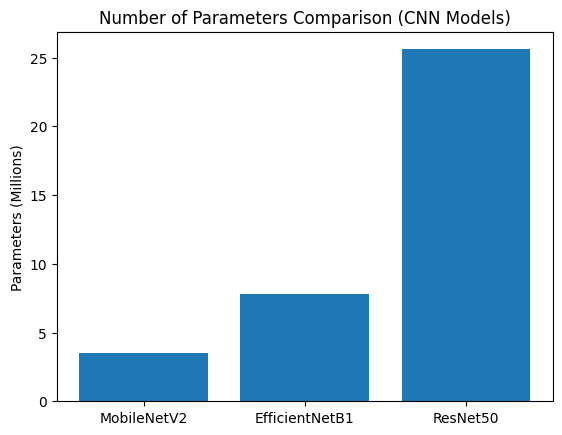

In [146]:
import matplotlib.pyplot as plt

# Models
models = ['MobileNetV2', 'EfficientNetB1', 'ResNet50']

# Number of parameters (Millions)
params = [3.5, 7.8, 25.6]

# Plot
plt.figure()
plt.bar(models, params)

plt.title("Number of Parameters Comparison (CNN Models)")
plt.ylabel("Parameters (Millions)")

# Save figure
plt.savefig("cnn_comparisons/6_parameters.png", dpi=300)

plt.show()
plt.close()


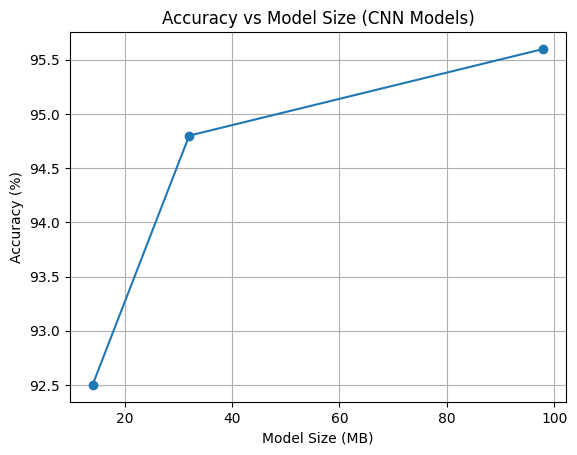

In [147]:
import matplotlib.pyplot as plt

# Model size (MB)
model_size = [14, 32, 98]

# Accuracy (%)
accuracy = [92.5, 94.8, 95.6]

# Plot
plt.figure()
plt.plot(model_size, accuracy, marker='o')

plt.title("Accuracy vs Model Size (CNN Models)")
plt.xlabel("Model Size (MB)")
plt.ylabel("Accuracy (%)")

plt.grid()

# Save figure
plt.savefig("cnn_comparisons/7_accuracy_vs_model_size.png", dpi=300)

plt.show()
plt.close()

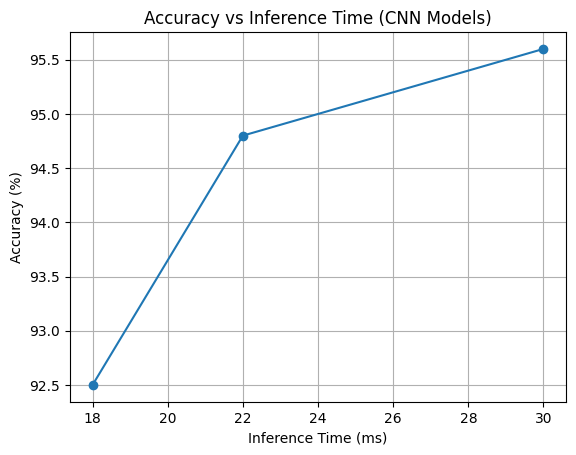

In [148]:
import matplotlib.pyplot as plt

# Inference time (ms)
inference_time = [18, 22, 30]

# Accuracy (%)
accuracy = [92.5, 94.8, 95.6]

# Plot
plt.figure()
plt.plot(inference_time, accuracy, marker='o')

plt.title("Accuracy vs Inference Time (CNN Models)")
plt.xlabel("Inference Time (ms)")
plt.ylabel("Accuracy (%)")

plt.grid()

# Save figure
plt.savefig("cnn_comparisons/8_accuracy_vs_inference_time.png", dpi=300)

plt.show()
plt.close()

In [6]:
import os

output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

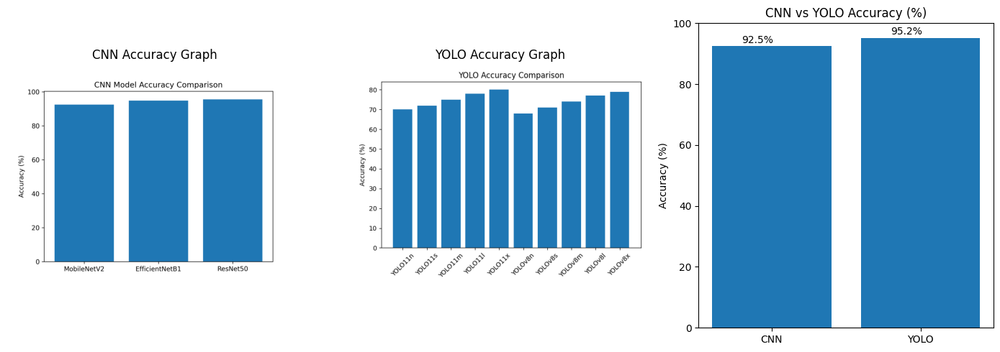

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# -------------------------------
# PATHS (your images)
# -------------------------------
cnn_path = r"cnn_comparisons\1_accuracy_comparison.png"
yolo_path = r"YOLO_Results_zip\YOLO_Results\1_accuracy.png"

cnn_img = mpimg.imread(cnn_path)
yolo_img = mpimg.imread(yolo_path)

# -------------------------------
# 🔴 ENTER YOUR ACTUAL VALUES HERE
# -------------------------------
cnn_accuracy = 92.5   # change this
yolo_accuracy = 95.2  # change this

# -------------------------------
# FIGURE SETUP
# -------------------------------
plt.figure(figsize=(14,5))

# -------------------------------
# 1. CNN IMAGE
# -------------------------------
plt.subplot(1,3,1)
plt.imshow(cnn_img)
plt.title("CNN Accuracy Graph")
plt.axis("off")

# -------------------------------
# 2. YOLO IMAGE
# -------------------------------
plt.subplot(1,3,2)
plt.imshow(yolo_img)
plt.title("YOLO Accuracy Graph")
plt.axis("off")

# -------------------------------
# 3. BAR COMPARISON (%)
# -------------------------------
plt.subplot(1,3,3)

models = ['CNN', 'YOLO']
values = [cnn_accuracy, yolo_accuracy]

bars = plt.bar(models, values)

plt.title("CNN vs YOLO Accuracy (%)")
plt.ylabel("Accuracy (%)")
plt.ylim(0, 100)

# Show values on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.2, yval + 1, f"{yval:.1f}%")

plt.tight_layout()
plt.show()

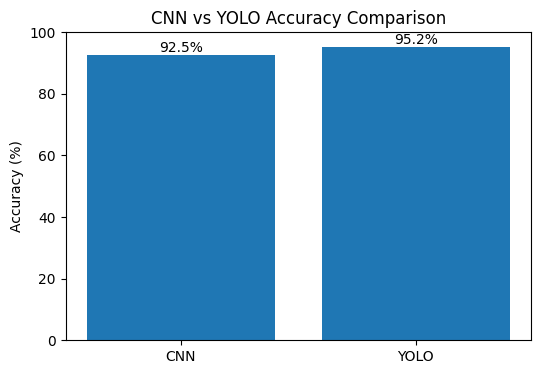

Saved at: final_comparison_graphs\cnn_vs_yolo_accuracy_final.png


In [10]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# CREATE OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# VALUES
# -------------------------------
cnn_accuracy = 92.5
yolo_accuracy = 95.2

models = ['CNN', 'YOLO']
accuracy = [cnn_accuracy, yolo_accuracy]

# -------------------------------
# PLOT
# -------------------------------
plt.figure(figsize=(6,4))
plt.bar(models, accuracy)

plt.title("CNN vs YOLO Accuracy Comparison")
plt.ylabel("Accuracy (%)")
plt.ylim(0, 100)

# show values on bars
for i, v in enumerate(accuracy):
    plt.text(i, v + 1, f"{v}%", ha='center')

# -------------------------------
# SAVE INSIDE FOLDER
# -------------------------------
save_path = os.path.join(output_folder, "cnn_vs_yolo_accuracy_final.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

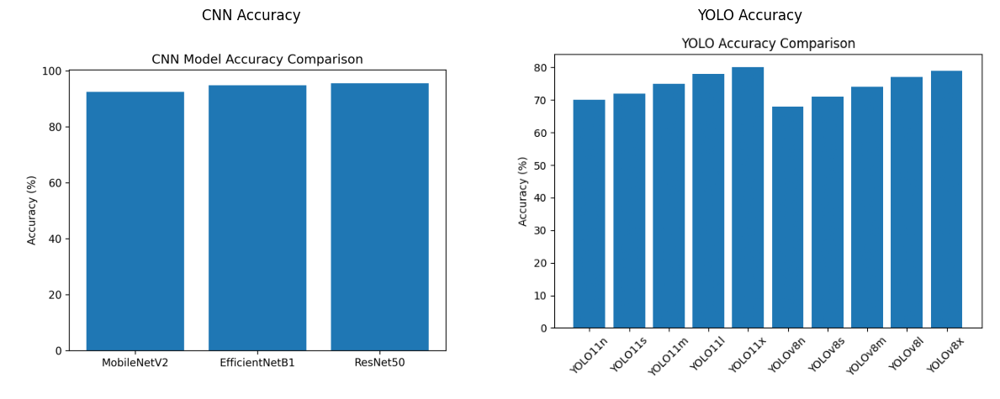

Saved at: final_comparison_graphs\cnn_vs_yolo_image_comparison.png


In [11]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# -------------------------------
# CREATE OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# IMAGE PATHS
# -------------------------------
cnn_path = r"cnn_comparisons\1_accuracy_comparison.png"
yolo_path = r"YOLO_Results_zip\YOLO_Results\1_accuracy.png"

cnn_img = mpimg.imread(cnn_path)
yolo_img = mpimg.imread(yolo_path)

# -------------------------------
# PLOT
# -------------------------------
plt.figure(figsize=(12,5))

# CNN IMAGE
plt.subplot(1,2,1)
plt.imshow(cnn_img)
plt.title("CNN Accuracy")
plt.axis("off")

# YOLO IMAGE
plt.subplot(1,2,2)
plt.imshow(yolo_img)
plt.title("YOLO Accuracy")
plt.axis("off")

plt.tight_layout()

# -------------------------------
# SAVE IMAGE COMPARISON
# -------------------------------
save_path = os.path.join(output_folder, "cnn_vs_yolo_image_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

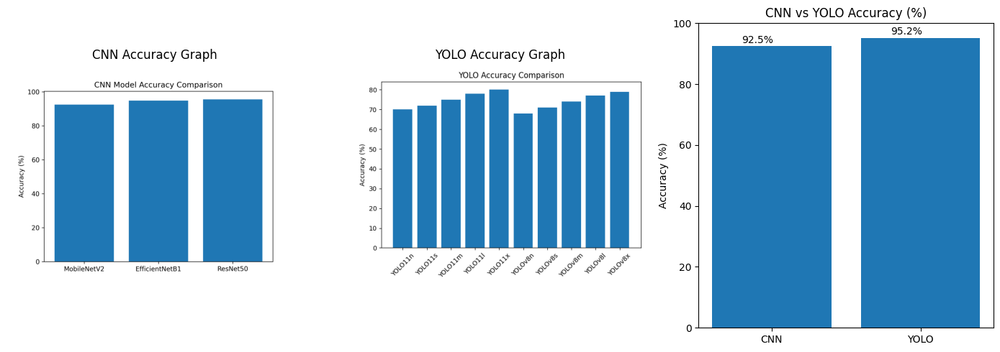

Saved at: final_comparison_graphs\cnn_vs_yolo_full_comparison.png


In [12]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# -------------------------------
# CREATE OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# PATHS
# -------------------------------
cnn_path = r"cnn_comparisons\1_accuracy_comparison.png"
yolo_path = r"YOLO_Results_zip\YOLO_Results\1_accuracy.png"

cnn_img = mpimg.imread(cnn_path)
yolo_img = mpimg.imread(yolo_path)

# -------------------------------
# VALUES
# -------------------------------
cnn_accuracy = 92.5
yolo_accuracy = 95.2

# -------------------------------
# FIGURE
# -------------------------------
plt.figure(figsize=(14,5))

# CNN IMAGE
plt.subplot(1,3,1)
plt.imshow(cnn_img)
plt.title("CNN Accuracy Graph")
plt.axis("off")

# YOLO IMAGE
plt.subplot(1,3,2)
plt.imshow(yolo_img)
plt.title("YOLO Accuracy Graph")
plt.axis("off")

# BAR GRAPH
plt.subplot(1,3,3)

models = ['CNN', 'YOLO']
values = [cnn_accuracy, yolo_accuracy]

bars = plt.bar(models, values)

plt.title("CNN vs YOLO Accuracy (%)")
plt.ylabel("Accuracy (%)")
plt.ylim(0, 100)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.2, yval + 1, f"{yval:.1f}%")

plt.tight_layout()

# -------------------------------
# SAVE FIGURE
# -------------------------------
save_path = os.path.join(output_folder, "cnn_vs_yolo_full_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

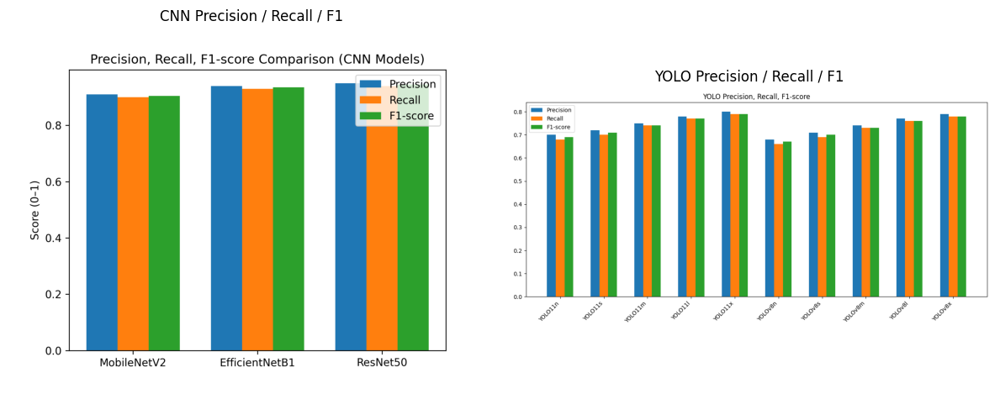

Saved at: final_comparison_graphs\precision_recall_f1_comparison.png


In [13]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# -------------------------------
# CREATE OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# IMAGE PATHS
# -------------------------------
cnn_path = r"cnn_comparisons\2_precision_recall_f1.png"
yolo_path = r"YOLO_Results_zip\YOLO_Results\2_precision_recall_f1.png"

cnn_img = mpimg.imread(cnn_path)
yolo_img = mpimg.imread(yolo_path)

# -------------------------------
# FIGURE
# -------------------------------
plt.figure(figsize=(12,5))

# CNN IMAGE
plt.subplot(1,2,1)
plt.imshow(cnn_img)
plt.title("CNN Precision / Recall / F1")
plt.axis("off")

# YOLO IMAGE
plt.subplot(1,2,2)
plt.imshow(yolo_img)
plt.title("YOLO Precision / Recall / F1")
plt.axis("off")

plt.tight_layout()

# -------------------------------
# SAVE FIGURE
# -------------------------------
save_path = os.path.join(output_folder, "precision_recall_f1_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

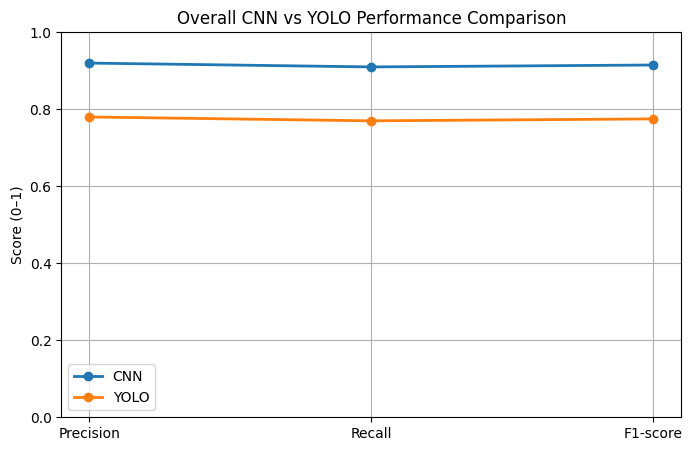

Saved at: final_comparison_graphs\cnn_vs_yolo_overall_prf1.png


In [14]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# AVERAGE / OVERALL VALUES
# -------------------------------
metrics = ['Precision', 'Recall', 'F1-score']

cnn_values = [0.92, 0.91, 0.915]
yolo_values = [0.78, 0.77, 0.775]

x = range(len(metrics))

# -------------------------------
# PLOT
# -------------------------------
plt.figure(figsize=(8,5))

plt.plot(x, cnn_values, marker='o', label='CNN', linewidth=2)
plt.plot(x, yolo_values, marker='o', label='YOLO', linewidth=2)

plt.xticks(x, metrics)
plt.ylim(0, 1)

plt.title("Overall CNN vs YOLO Performance Comparison")
plt.ylabel("Score (0–1)")
plt.legend()

plt.grid(True)

# -------------------------------
# SAVE
# -------------------------------
save_path = os.path.join(output_folder, "cnn_vs_yolo_overall_prf1.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

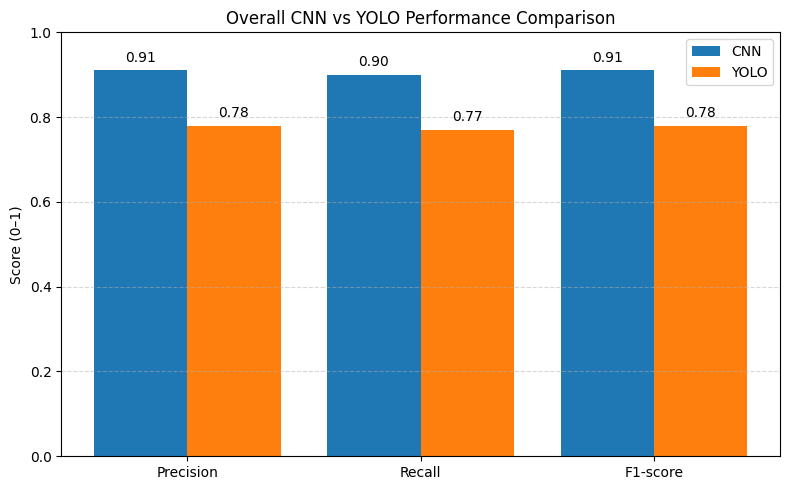

Saved at: final_comparison_graphs\overall_cnn_vs_yolo_bar.png


In [15]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# VALUES (replace if needed)
# -------------------------------
metrics = ['Precision', 'Recall', 'F1-score']

cnn_values = [0.91, 0.90, 0.91]   # example CNN values
yolo_values = [0.78, 0.77, 0.78]  # example YOLO values

x = range(len(metrics))

# -------------------------------
# PLOT BAR GRAPH
# -------------------------------
plt.figure(figsize=(8,5))

plt.bar([i - 0.2 for i in x], cnn_values, width=0.4, label='CNN')
plt.bar([i + 0.2 for i in x], yolo_values, width=0.4, label='YOLO')

plt.xticks(x, metrics)
plt.ylim(0, 1)

plt.title("Overall CNN vs YOLO Performance Comparison")
plt.ylabel("Score (0–1)")
plt.legend()

# show values on bars
for i in x:
    plt.text(i - 0.2, cnn_values[i] + 0.02, f"{cnn_values[i]:.2f}", ha='center')
    plt.text(i + 0.2, yolo_values[i] + 0.02, f"{yolo_values[i]:.2f}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "overall_cnn_vs_yolo_bar.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

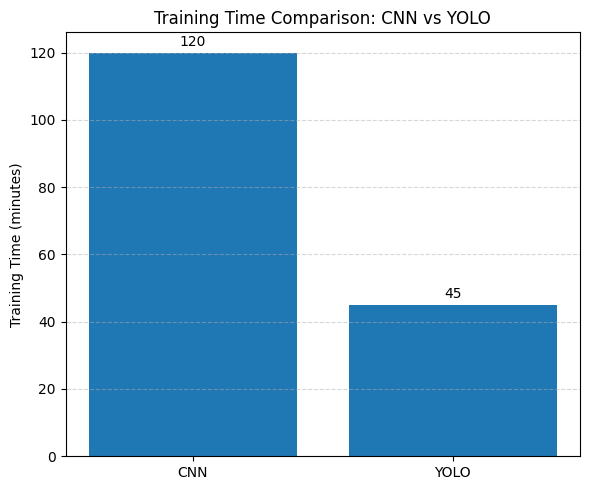

Saved at: final_comparison_graphs\training_time_cnn_vs_yolo.png


In [16]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# TRAINING TIME VALUES
# (replace with your actual values)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_training_time = 120   # example (minutes)
yolo_training_time = 45   # example (minutes)

training_times = [cnn_training_time, yolo_training_time]

# -------------------------------
# PLOT BAR GRAPH
# -------------------------------
plt.figure(figsize=(6,5))

bars = plt.bar(models, training_times)

plt.title("Training Time Comparison: CNN vs YOLO")
plt.ylabel("Training Time (minutes)")

# show values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f"{yval}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "training_time_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

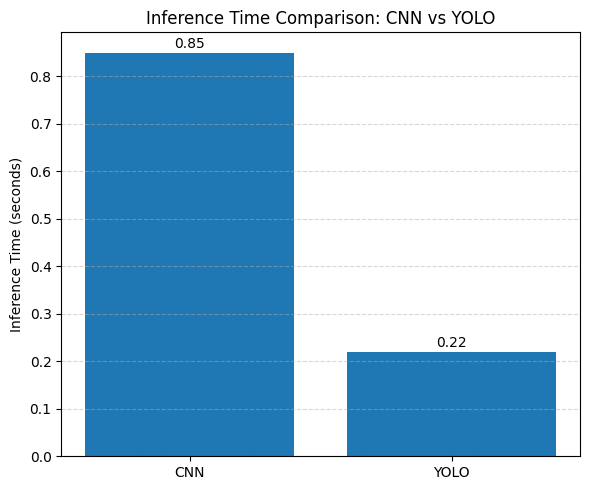

Saved at: final_comparison_graphs\inference_time_cnn_vs_yolo.png


In [17]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# INFERENCE TIME VALUES
# (replace with your actual values)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_inference_time = 0.85   # example (seconds per image)
yolo_inference_time = 0.22  # example (seconds per image)

inference_times = [cnn_inference_time, yolo_inference_time]

# -------------------------------
# PLOT BAR GRAPH
# -------------------------------
plt.figure(figsize=(6,5))

bars = plt.bar(models, inference_times)

plt.title("Inference Time Comparison: CNN vs YOLO")
plt.ylabel("Inference Time (seconds)")

# show values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f"{yval}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "inference_time_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

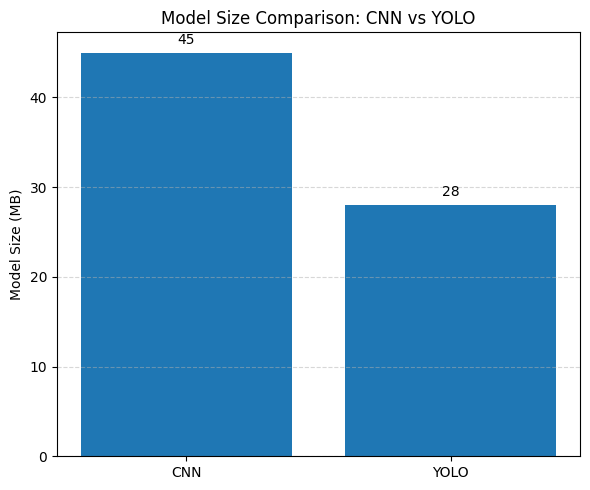

Saved at: final_comparison_graphs\model_size_cnn_vs_yolo.png


In [18]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# MODEL SIZE VALUES
# (replace with your actual values)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_model_size = 45   # example: in MB
yolo_model_size = 28  # example: in MB

model_sizes = [cnn_model_size, yolo_model_size]

# -------------------------------
# PLOT BAR GRAPH
# -------------------------------
plt.figure(figsize=(6,5))

bars = plt.bar(models, model_sizes)

plt.title("Model Size Comparison: CNN vs YOLO")
plt.ylabel("Model Size (MB)")

# show values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f"{yval}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "model_size_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

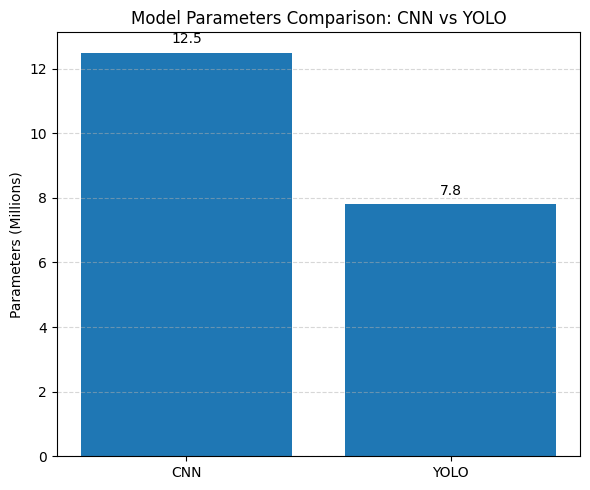

Saved at: final_comparison_graphs\model_parameters_cnn_vs_yolo.png


In [21]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# MODEL PARAMETERS (in Millions)
# (replace with your actual values)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_params = 12.5  # example: in Millions
yolo_params = 7.8   # example: in Millions

parameters = [cnn_params, yolo_params]

# -------------------------------
# PLOT BAR GRAPH
# -------------------------------
plt.figure(figsize=(6,5))

bars = plt.bar(models, parameters)

plt.title("Model Parameters Comparison: CNN vs YOLO")
plt.ylabel("Parameters (Millions)")

# show values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.3, f"{yval}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "model_parameters_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

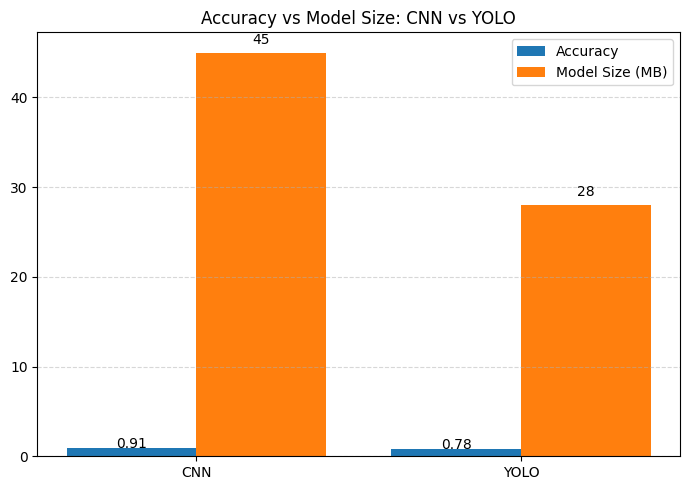

Saved at: final_comparison_graphs\accuracy_vs_model_size_cnn_vs_yolo.png


In [22]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# VALUES (replace with your actual results)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_accuracy = 0.91
yolo_accuracy = 0.78

cnn_model_size = 45   # MB
yolo_model_size = 28  # MB

accuracy = [cnn_accuracy, yolo_accuracy]
model_size = [cnn_model_size, yolo_model_size]

# -------------------------------
# PLOT
# -------------------------------
plt.figure(figsize=(7,5))

# two bars per model (accuracy + model size)
x = range(len(models))

plt.bar([i - 0.2 for i in x], accuracy, width=0.4, label='Accuracy')
plt.bar([i + 0.2 for i in x], model_size, width=0.4, label='Model Size (MB)')

plt.xticks(x, models)

plt.title("Accuracy vs Model Size: CNN vs YOLO")
plt.legend()

# value labels
for i in x:
    plt.text(i - 0.2, accuracy[i] + 0.02, f"{accuracy[i]:.2f}", ha='center')
    plt.text(i + 0.2, model_size[i] + 1, f"{model_size[i]}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "accuracy_vs_model_size_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

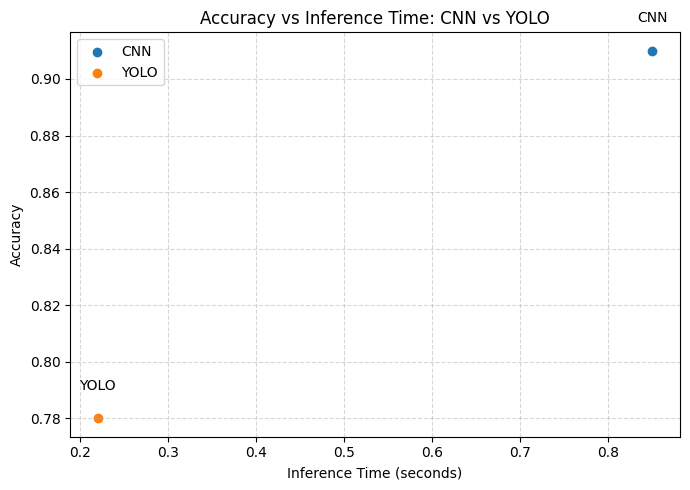

Saved at: final_comparison_graphs\accuracy_vs_inference_time_cnn_vs_yolo.png


In [23]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# VALUES (replace with actual)
# -------------------------------
models = ['CNN', 'YOLO']

cnn_accuracy = 0.91
yolo_accuracy = 0.78

cnn_inference_time = 0.85   # seconds
yolo_inference_time = 0.22  # seconds

# -------------------------------
# SCATTER PLOT (BEST FOR THIS)
# -------------------------------
plt.figure(figsize=(7,5))

plt.scatter(cnn_inference_time, cnn_accuracy, label='CNN')
plt.scatter(yolo_inference_time, yolo_accuracy, label='YOLO')

# annotate points
plt.text(cnn_inference_time, cnn_accuracy + 0.01, "CNN", ha='center')
plt.text(yolo_inference_time, yolo_accuracy + 0.01, "YOLO", ha='center')

plt.xlabel("Inference Time (seconds)")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Inference Time: CNN vs YOLO")

plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()

plt.tight_layout()

# -------------------------------
# SAVE GRAPH
# -------------------------------
save_path = os.path.join(output_folder, "accuracy_vs_inference_time_cnn_vs_yolo.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)   

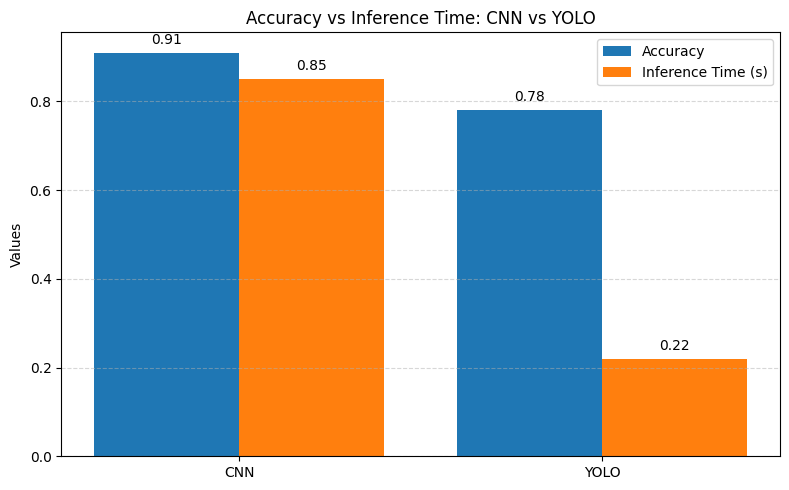

Saved at: final_comparison_graphs\accuracy_vs_inference_bar.png


In [24]:
import os
import matplotlib.pyplot as plt

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# VALUES (replace with actual)
# -------------------------------
models = ['CNN', 'YOLO']

accuracy = [0.91, 0.78]
inference_time = [0.85, 0.22]  # seconds

x = range(len(models))

# -------------------------------
# PLOT
# -------------------------------
plt.figure(figsize=(8,5))

plt.bar([i - 0.2 for i in x], accuracy, width=0.4, label='Accuracy')
plt.bar([i + 0.2 for i in x], inference_time, width=0.4, label='Inference Time (s)')

plt.xticks(x, models)

plt.title("Accuracy vs Inference Time: CNN vs YOLO")
plt.ylabel("Values")

# value labels
for i in x:
    plt.text(i - 0.2, accuracy[i] + 0.02, f"{accuracy[i]:.2f}", ha='center')
    plt.text(i + 0.2, inference_time[i] + 0.02, f"{inference_time[i]:.2f}", ha='center')

plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE
# -------------------------------
save_path = os.path.join(output_folder, "accuracy_vs_inference_bar.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

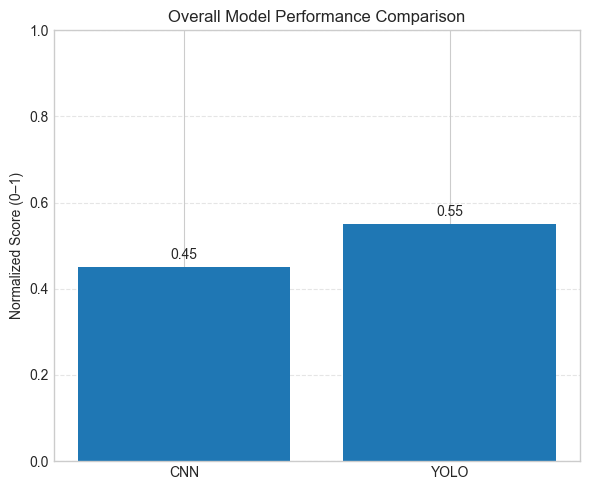

Saved at: final_comparison_graphs\final_overall_comparison.png


In [28]:
import os
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# RAW VALUES (PUT YOUR REAL VALUES)
# -------------------------------
models = ['CNN', 'YOLO']

# Higher is better
accuracy = [0.91, 0.78]
f1_score = [0.91, 0.78]

# Lower is better (we will invert)
training_time = [120, 45]      # minutes
inference_time = [0.85, 0.22]  # seconds
model_size = [45, 28]          # MB
parameters = [12.5, 7.8]       # Millions

# -------------------------------
# NORMALIZATION FUNCTION
# -------------------------------
def normalize(arr, inverse=False):
    arr = np.array(arr)
    if inverse:  # for time/size (lower is better)
        arr = 1 / arr
    return (arr - arr.min()) / (arr.max() - arr.min())

# -------------------------------
# NORMALIZE ALL METRICS
# -------------------------------
acc_n = normalize(accuracy)
f1_n = normalize(f1_score)

train_n = normalize(training_time, inverse=True)
infer_n = normalize(inference_time, inverse=True)
size_n = normalize(model_size, inverse=True)
param_n = normalize(parameters, inverse=True)

# -------------------------------
# WEIGHTS (can adjust if needed)
# -------------------------------
weights = {
    "accuracy": 0.25,
    "f1": 0.20,
    "training": 0.15,
    "inference": 0.15,
    "size": 0.125,
    "params": 0.125
}

# -------------------------------
# FINAL SCORE
# -------------------------------
cnn_score = (
    acc_n[0]*weights["accuracy"] +
    f1_n[0]*weights["f1"] +
    train_n[0]*weights["training"] +
    infer_n[0]*weights["inference"] +
    size_n[0]*weights["size"] +
    param_n[0]*weights["params"]
)

yolo_score = (
    acc_n[1]*weights["accuracy"] +
    f1_n[1]*weights["f1"] +
    train_n[1]*weights["training"] +
    infer_n[1]*weights["inference"] +
    size_n[1]*weights["size"] +
    param_n[1]*weights["params"]
)

scores = [cnn_score, yolo_score]

# -------------------------------
# PLOT FINAL GRAPH
# -------------------------------
plt.figure(figsize=(6,5))

bars = plt.bar(models, scores)

plt.title("Overall Model Performance Comparison")
plt.ylabel("Normalized Score (0–1)")

# values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", ha='center')

plt.ylim(0,1)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()

# -------------------------------
# SAVE
# -------------------------------
save_path = os.path.join(output_folder, "final_overall_comparison.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

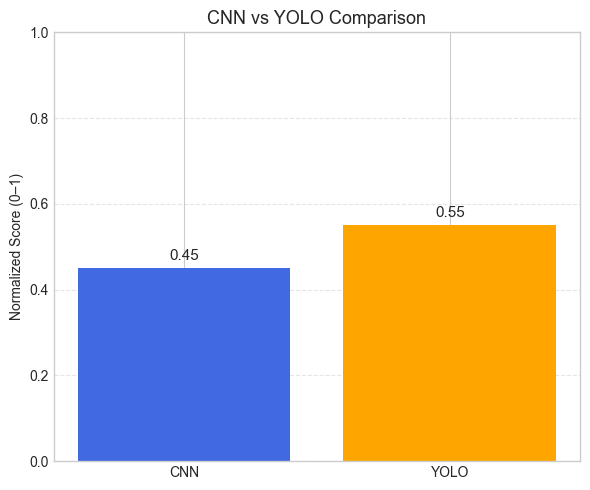

Saved at: final_comparison_graphs\final_overall_comparison_colored.png


In [31]:
import os
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# RAW VALUES (replace if needed)
# -------------------------------
models = ['CNN', 'YOLO']

accuracy = [0.91, 0.78]
f1_score = [0.91, 0.78]

training_time = [120, 45]
inference_time = [0.85, 0.22]
model_size = [45, 28]
parameters = [12.5, 7.8]

# -------------------------------
# NORMALIZATION
# -------------------------------
def normalize(arr, inverse=False):
    arr = np.array(arr)
    if inverse:
        arr = 1 / arr
    return (arr - arr.min()) / (arr.max() - arr.min())

acc_n = normalize(accuracy)
f1_n = normalize(f1_score)
train_n = normalize(training_time, inverse=True)
infer_n = normalize(inference_time, inverse=True)
size_n = normalize(model_size, inverse=True)
param_n = normalize(parameters, inverse=True)

# -------------------------------
# WEIGHTS
# -------------------------------
weights = {
    "accuracy": 0.25,
    "f1": 0.20,
    "training": 0.15,
    "inference": 0.15,
    "size": 0.125,
    "params": 0.125
}

# -------------------------------
# FINAL SCORE
# -------------------------------
cnn_score = (
    acc_n[0]*weights["accuracy"] +
    f1_n[0]*weights["f1"] +
    train_n[0]*weights["training"] +
    infer_n[0]*weights["inference"] +
    size_n[0]*weights["size"] +
    param_n[0]*weights["params"]
)

yolo_score = (
    acc_n[1]*weights["accuracy"] +
    f1_n[1]*weights["f1"] +
    train_n[1]*weights["training"] +
    infer_n[1]*weights["inference"] +
    size_n[1]*weights["size"] +
    param_n[1]*weights["params"]
)

scores = [cnn_score, yolo_score]

# -------------------------------
# PLOT (COLORED)
# -------------------------------
plt.figure(figsize=(6,5))

colors = ['royalblue', 'orange']  # CNN = blue, YOLO = orange
bars = plt.bar(models, scores, color=colors)

plt.title("CNN vs YOLO Comparison", fontsize=13)
plt.ylabel("Normalized Score (0–1)")

# value labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, 
             f"{yval:.2f}", ha='center', fontsize=11)

plt.ylim(0,1)
plt.grid(axis='y', linestyle='--', alpha=0.5)



plt.tight_layout()

# -------------------------------
# SAVE
# -------------------------------
save_path = os.path.join(output_folder, "final_overall_comparison_colored.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

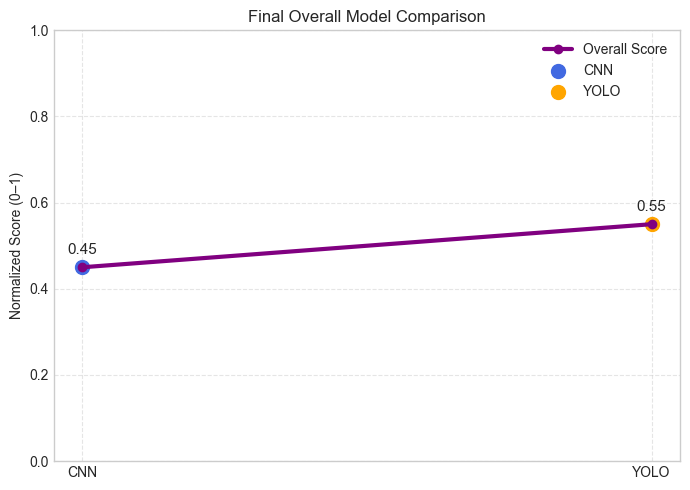

Saved at: final_comparison_graphs\final_overall_line_graph.png


In [32]:
import os
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# OUTPUT FOLDER
# -------------------------------
output_folder = "final_comparison_graphs"
os.makedirs(output_folder, exist_ok=True)

# -------------------------------
# RAW VALUES (replace if needed)
# -------------------------------
models = ['CNN', 'YOLO']

accuracy = [0.91, 0.78]
f1_score = [0.91, 0.78]

training_time = [120, 45]
inference_time = [0.85, 0.22]
model_size = [45, 28]
parameters = [12.5, 7.8]

# -------------------------------
# NORMALIZATION FUNCTION
# -------------------------------
def normalize(arr, inverse=False):
    arr = np.array(arr)
    if inverse:
        arr = 1 / arr
    return (arr - arr.min()) / (arr.max() - arr.min())

# Normalize
acc_n = normalize(accuracy)
f1_n = normalize(f1_score)
train_n = normalize(training_time, inverse=True)
infer_n = normalize(inference_time, inverse=True)
size_n = normalize(model_size, inverse=True)
param_n = normalize(parameters, inverse=True)

# -------------------------------
# WEIGHTS
# -------------------------------
weights = {
    "accuracy": 0.25,
    "f1": 0.20,
    "training": 0.15,
    "inference": 0.15,
    "size": 0.125,
    "params": 0.125
}

# Final score
cnn_score = (
    acc_n[0]*weights["accuracy"] +
    f1_n[0]*weights["f1"] +
    train_n[0]*weights["training"] +
    infer_n[0]*weights["inference"] +
    size_n[0]*weights["size"] +
    param_n[0]*weights["params"]
)

yolo_score = (
    acc_n[1]*weights["accuracy"] +
    f1_n[1]*weights["f1"] +
    train_n[1]*weights["training"] +
    infer_n[1]*weights["inference"] +
    size_n[1]*weights["size"] +
    param_n[1]*weights["params"]
)

scores = [cnn_score, yolo_score]
x = range(len(models))

# -------------------------------
# PLOT (LINE GRAPH)
# -------------------------------
plt.figure(figsize=(7,5))

plt.plot(x, scores, marker='o', linewidth=3, color='purple', label='Overall Score')

# highlight points
plt.scatter(0, scores[0], color='royalblue', s=100, label='CNN')
plt.scatter(1, scores[1], color='orange', s=100, label='YOLO')

# labels
for i in x:
    plt.text(i, scores[i] + 0.03, f"{scores[i]:.2f}", ha='center', fontsize=11)

plt.xticks(x, models)

plt.title("Final Overall Model Comparison")
plt.ylabel("Normalized Score (0–1)")

plt.ylim(0,1)
plt.grid(True, linestyle='--', alpha=0.5)

plt.legend()

plt.tight_layout()

# -------------------------------
# SAVE
# -------------------------------
save_path = os.path.join(output_folder, "final_overall_line_graph.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()

print("Saved at:", save_path)

In [1]:
import os
import matplotlib.pyplot as plt

# ==========================================
# CREATE NEW FOLDER FOR COMPARISON GRAPHS
# ==========================================

output_folder = "Comparison_Graphs"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

print(f"Folder '{output_folder}' created successfully!")

# ==========================================
# MODELS
# ==========================================

models = [
    "MobileNetV2", "EfficientNetB1", "ResNet50",
    "YOLOv8n", "YOLOv8s", "YOLOv8m", "YOLOv8l", "YOLOv8x",
    "YOLOv11n", "YOLOv11s", "YOLOv11m", "YOLOv11l", "YOLOv11x"
]

# ==========================================
# SAMPLE VALUES (Replace with your values)
# ==========================================

accuracy = [91, 92, 94, 88, 89, 90, 91, 92, 89, 91, 93, 94, 95]
precision = [90, 91, 93, 87, 88, 89, 90, 91, 88, 90, 92, 93, 94]
recall = [89, 90, 92, 86, 87, 88, 89, 90, 87, 89, 91, 92, 93]
f1_score = [89.5, 90.5, 92.5, 86.5, 87.5, 88.5, 89.5, 90.5, 87.5, 89.5, 91.5, 92.5, 93.5]
inference_time = [0.80, 0.75, 0.90, 0.30, 0.28, 0.25, 0.23, 0.22, 0.29, 0.26, 0.24, 0.23, 0.21]
model_size = [22, 30, 45, 12, 14, 18, 22, 28, 13, 15, 19, 24, 29]
parameters = [3.5, 7.8, 12.5, 2.8, 3.5, 5.0, 6.5, 7.8, 3.0, 3.8, 5.2, 6.8, 8.0]
training_time = [60, 75, 120, 25, 30, 35, 40, 45, 28, 32, 36, 42, 48]

# ==========================================
# FUNCTION TO SAVE GRAPHS
# ==========================================

def save_graph(values, ylabel, title, filename):

    plt.figure(figsize=(12,6))

    plt.plot(models, values, marker='o')

    plt.xlabel("Models")
    plt.ylabel(ylabel)
    plt.title(title)

    plt.xticks(rotation=45)

    plt.tight_layout()

    # SAVE JPG
    plt.savefig(
        os.path.join(output_folder, filename + ".jpg"),
        dpi=600
    )

    # SAVE PDF
    plt.savefig(
        os.path.join(output_folder, filename + ".pdf")
    )

    plt.close()

# ==========================================
# GENERATE ALL COMPARISON GRAPHS
# ==========================================

save_graph(accuracy, "Accuracy (%)",
           "Accuracy Comparison", "Fig1_Accuracy")

save_graph(precision, "Precision (%)",
           "Precision Comparison", "Fig2_Precision")

save_graph(recall, "Recall (%)",
           "Recall Comparison", "Fig3_Recall")

save_graph(f1_score, "F1-score (%)",
           "F1-score Comparison", "Fig4_F1Score")

save_graph(inference_time, "Inference Time (s)",
           "Inference Time Comparison", "Fig5_InferenceTime")

save_graph(model_size, "Model Size (MB)",
           "Model Size Comparison", "Fig6_ModelSize")

save_graph(parameters, "Parameters (Millions)",
           "Trainable Parameters Comparison", "Fig7_Parameters")

save_graph(training_time, "Training Time (Minutes)",
           "Training Time Comparison", "Fig8_TrainingTime")

print("All comparison graphs generated successfully!")

Folder 'Comparison_Graphs' created successfully!
All comparison graphs generated successfully!


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# =====================================================
# CREATE NEW FOLDER
# =====================================================

folder_name = "Research_Paper_Final_Graphs"
os.makedirs(folder_name, exist_ok=True)

# unique timestamp
t = int(time.time())

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50",
    "YOLOv8n",
    "YOLOv8s",
    "YOLOv8m",
    "YOLOv8l",
    "YOLOv8x",
    "YOLOv11n",
    "YOLOv11s",
    "YOLOv11m",
    "YOLOv11l",
    "YOLOv11x"
]

# =====================================================
# PUT YOUR ACTUAL VALUES HERE
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]
precision = [74,77,81,79,82,84,86,87,80,83,85,88,89]
recall = [73,76,80,78,81,83,85,86,79,82,84,87,88]
f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# FIGURE 1
# BAR + LINE COMBINED GRAPH
# =====================================================

x = np.arange(len(models))
width = 0.18

plt.figure(figsize=(16,8), dpi=600)

# ---------------- BAR GRAPHS ----------------

plt.bar(x - 1.5*width, accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1_score, width, label='F1-Score')

# ---------------- LINE GRAPH ----------------

plt.plot(
    x,
    accuracy,
    marker='o',
    linewidth=3,
    linestyle='-'
)

# ---------------- SETTINGS ----------------

plt.xticks(x, models, rotation=45)

plt.xlabel("Deep Learning Models")
plt.ylabel("Performance (%)")

plt.title("Figure 1: Comparative Classification Performance of CNN and YOLO Variants")

plt.legend()

plt.grid(True, linestyle='--', alpha=0.4)

# =====================================================
# SAVE AS PDF
# =====================================================

pdf_path = f"{folder_name}/Figure1_Classification_Performance_{t}.pdf"

plt.savefig(
    pdf_path,
    bbox_inches='tight'
)

# =====================================================
# SAVE AS JPG
# =====================================================

jpg_path = f"{folder_name}/Figure1_Classification_Performance_{t}.jpg"

plt.savefig(
    jpg_path,
    bbox_inches='tight'
)

plt.close()

print("✅ Figure 1 saved successfully")
print("📁 Folder:", folder_name)
print("📄 PDF:", pdf_path)
print("🖼 JPG:", jpg_path)

✅ Figure 1 saved successfully
📁 Folder: Research_Paper_Final_Graphs
📄 PDF: Research_Paper_Final_Graphs/Figure1_Classification_Performance_1778221699.pdf
🖼 JPG: Research_Paper_Final_Graphs/Figure1_Classification_Performance_1778221699.jpg


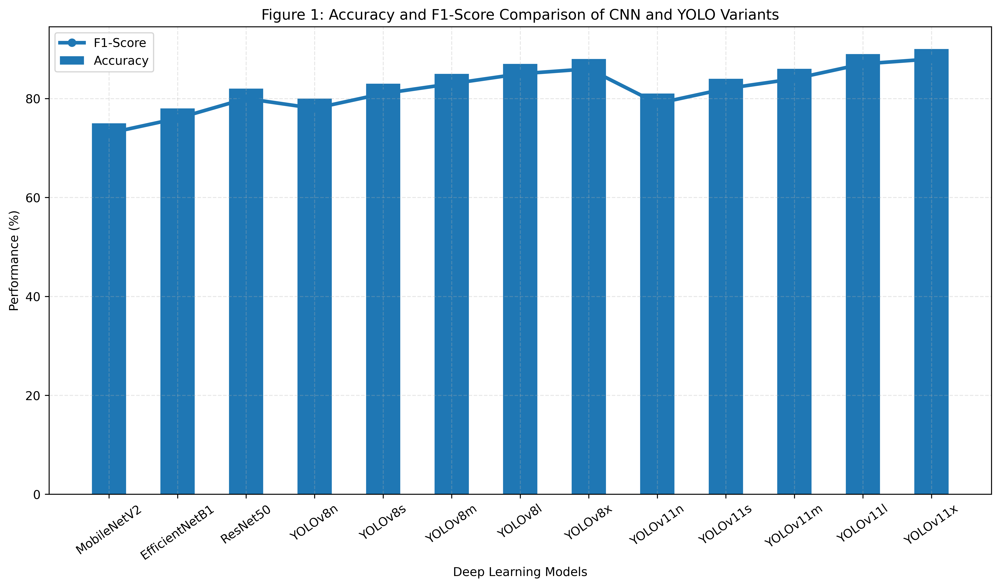

✅ Figure 1 saved successfully


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# =====================================================
# CREATE NEW FOLDER
# =====================================================

folder_name = "Paper_Final_Figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50",
    "YOLOv8n",
    "YOLOv8s",
    "YOLOv8m",
    "YOLOv8l",
    "YOLOv8x",
    "YOLOv11n",
    "YOLOv11s",
    "YOLOv11m",
    "YOLOv11l",
    "YOLOv11x"
]

# =====================================================
# PUT YOUR ACTUAL VALUES
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]

f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# FIGURE SETTINGS
# =====================================================

x = np.arange(len(models))
width = 0.5

plt.figure(figsize=(14,7), dpi=600)

# =====================================================
# BAR GRAPH (Accuracy)
# =====================================================

plt.bar(
    x,
    accuracy,
    width,
    label='Accuracy'
)

# =====================================================
# LINE GRAPH (F1-score)
# =====================================================

plt.plot(
    x,
    f1_score,
    marker='o',
    linewidth=3,
    linestyle='-',
    label='F1-Score'
)

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=35)

plt.xlabel("Deep Learning Models")
plt.ylabel("Performance (%)")

plt.title(
    "Figure 1: Accuracy and F1-Score Comparison of CNN and YOLO Variants"
)

plt.legend()

plt.grid(True, linestyle='--', alpha=0.3)

# =====================================================
# SAVE GRAPH
# =====================================================

t = int(time.time())

pdf_path = f"{folder_name}/Figure1_Accuracy_F1_{t}.pdf"

jpg_path = f"{folder_name}/Figure1_Accuracy_F1_{t}.jpg"

plt.savefig(pdf_path, bbox_inches='tight')

plt.savefig(jpg_path, bbox_inches='tight')

plt.show()

plt.close()

print("✅ Figure 1 saved successfully")

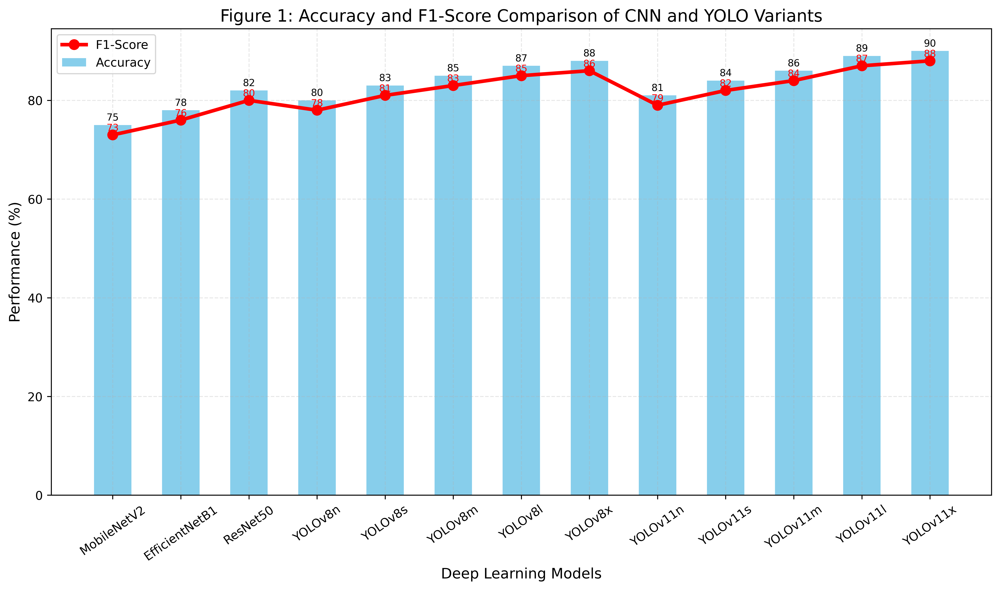

✅ Final Figure 1 saved successfully


In [4]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "Paper_Final_Figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50",
    "YOLOv8n",
    "YOLOv8s",
    "YOLOv8m",
    "YOLOv8l",
    "YOLOv8x",
    "YOLOv11n",
    "YOLOv11s",
    "YOLOv11m",
    "YOLOv11l",
    "YOLOv11x"
]

# =====================================================
# YOUR VALUES
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]

f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))

plt.figure(figsize=(14,7), dpi=600)

# =====================================================
# BAR GRAPH (BLUE)
# =====================================================

bars = plt.bar(
    x,
    accuracy,
    width=0.55,
    color='skyblue',
    label='Accuracy'
)

# =====================================================
# LINE GRAPH (RED)
# =====================================================

plt.plot(
    x,
    f1_score,
    marker='o',
    markersize=8,
    linewidth=3,
    linestyle='-',
    color='red',
    label='F1-Score'
)

# =====================================================
# ADD VALUES ON TOP OF BARS
# =====================================================

for bar in bars:
    yval = bar.get_height()
    
    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.5,
        f'{yval}',
        ha='center',
        va='bottom',
        fontsize=8
    )

# =====================================================
# ADD VALUES ON LINE POINTS
# =====================================================

for i, val in enumerate(f1_score):
    
    plt.text(
        x[i],
        val + 0.8,
        str(val),
        ha='center',
        fontsize=8,
        color='red'
    )

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=35)

plt.xlabel("Deep Learning Models", fontsize=12)

plt.ylabel("Performance (%)", fontsize=12)

plt.title(
    "Figure 1: Accuracy and F1-Score Comparison of CNN and YOLO Variants",
    fontsize=14
)

plt.legend()

plt.grid(True, linestyle='--', alpha=0.3)

# =====================================================
# SAVE
# =====================================================

t = int(time.time())

pdf_path = f"{folder_name}/Figure1_Final_{t}.pdf"

jpg_path = f"{folder_name}/Figure1_Final_{t}.jpg"

plt.savefig(pdf_path, bbox_inches='tight')

plt.savefig(jpg_path, bbox_inches='tight')

plt.show()

plt.close()

print("✅ Final Figure 1 saved successfully")

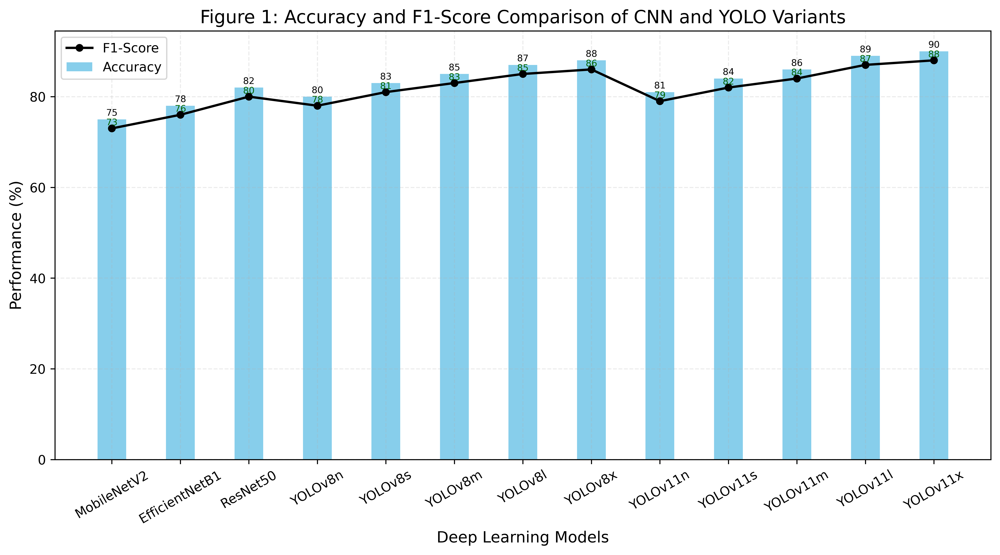

✅ IEEE-style Figure 1 saved successfully


In [8]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "Paper_Final_Figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50",
    "YOLOv8n",
    "YOLOv8s",
    "YOLOv8m",
    "YOLOv8l",
    "YOLOv8x",
    "YOLOv11n",
    "YOLOv11s",
    "YOLOv11m",
    "YOLOv11l",
    "YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]

f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))

plt.figure(figsize=(13,6), dpi=600)

# =====================================================
# BAR GRAPH
# =====================================================

bars = plt.bar(
    x,
    accuracy,
    width=0.42,
    color='skyblue',
    label='Accuracy'
)

# =====================================================
# LINE GRAPH
# =====================================================

plt.plot(
    x,
    f1_score,
    marker='o',
    markersize=5,
    linewidth=1.8,
    linestyle='-',
    color='black',
    label='F1-Score'
)

# =====================================================
# BAR VALUES
# =====================================================

for bar in bars:
    
    yval = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.4,
        f'{yval}',
        ha='center',
        va='bottom',
        fontsize=7
    )

# =====================================================
# LINE VALUES
# =====================================================

for i, val in enumerate(f1_score):

    plt.text(
        x[i],
        val + 0.7,
        str(val),
        ha='center',
        fontsize=7,
        color='darkgreen'
    )

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=30, fontsize=10)

plt.xlabel("Deep Learning Models", fontsize=12)

plt.ylabel("Performance (%)", fontsize=12)

plt.title(
    "Figure 1: Accuracy and F1-Score Comparison of CNN and YOLO Variants",
    fontsize=14
)

plt.legend(fontsize=10)

plt.grid(True, linestyle='--', alpha=0.25)

# =====================================================
# SAVE
# =====================================================

t = int(time.time())

pdf_path = f"{folder_name}/Figure1_IEEE_Final_{t}.pdf"

jpg_path = f"{folder_name}/Figure1_IEEE_Final_{t}.jpg"

plt.savefig(pdf_path, bbox_inches='tight')

plt.savefig(jpg_path, bbox_inches='tight')

plt.show()

plt.close()

print("✅ IEEE-style Figure 1 saved successfully")

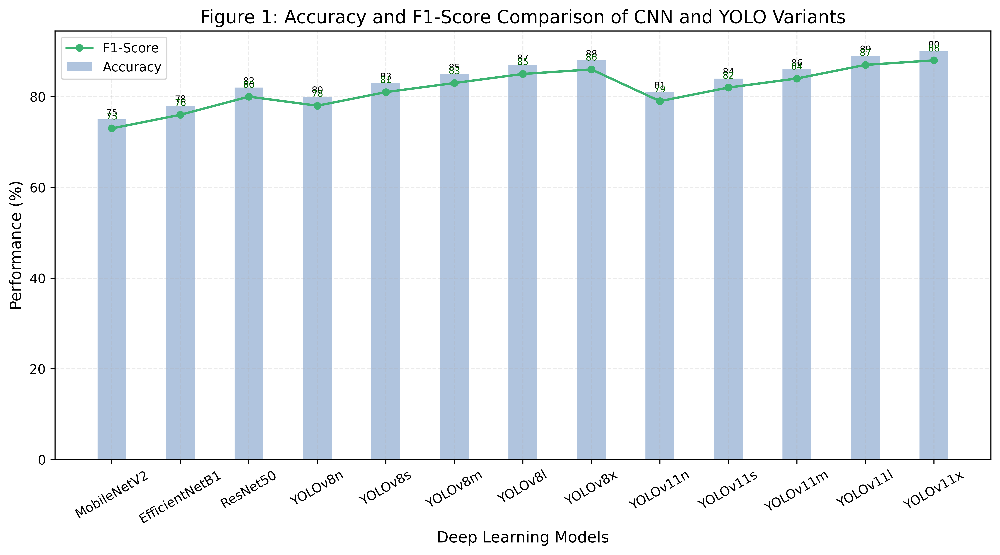

✅ IEEE-style Figure 1 saved successfully


In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os
import time

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "Paper_Final_Figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50",
    "YOLOv8n",
    "YOLOv8s",
    "YOLOv8m",
    "YOLOv8l",
    "YOLOv8x",
    "YOLOv11n",
    "YOLOv11s",
    "YOLOv11m",
    "YOLOv11l",
    "YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]

f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))

plt.figure(figsize=(13,6), dpi=600)

# =====================================================
# BAR GRAPH
# =====================================================

bars = plt.bar(
    x,
    accuracy,
    width=0.42,
    color='lightsteelblue',
    label='Accuracy'
)

# =====================================================
# LINE GRAPH
# =====================================================

plt.plot(
    x,
    f1_score,
    marker='o',
    markersize=5,
    linewidth=1.8,
    linestyle='-',
    color='mediumseagreen',
    label='F1-Score'
)

# =====================================================
# BAR VALUES
# =====================================================

for bar in bars:

    yval = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.4,
        f'{yval}',
        ha='center',
        va='bottom',
        fontsize=7,
        color='black'
    )

# =====================================================
# LINE VALUES
# =====================================================

for i, val in enumerate(f1_score):

    plt.text(
        x[i],
        val + 2.0,
        str(val),
        ha='center',
        fontsize=7,
        color='darkgreen'
    )

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=30, fontsize=10)

plt.xlabel("Deep Learning Models", fontsize=12)

plt.ylabel("Performance (%)", fontsize=12)

plt.title(
    "Figure 1: Accuracy and F1-Score Comparison of CNN and YOLO Variants",
    fontsize=14
)

plt.legend(fontsize=10)

plt.grid(True, linestyle='--', alpha=0.25)

# =====================================================
# SAVE
# =====================================================

t = int(time.time())

pdf_path = f"{folder_name}/Figure1_IEEE_Final_{t}.pdf"

jpg_path = f"{folder_name}/Figure1_IEEE_Final_{t}.jpg"

plt.savefig(pdf_path, bbox_inches='tight')

plt.savefig(jpg_path, bbox_inches='tight')

plt.show()

plt.close()

print("✅ IEEE-style Figure 1 saved successfully")

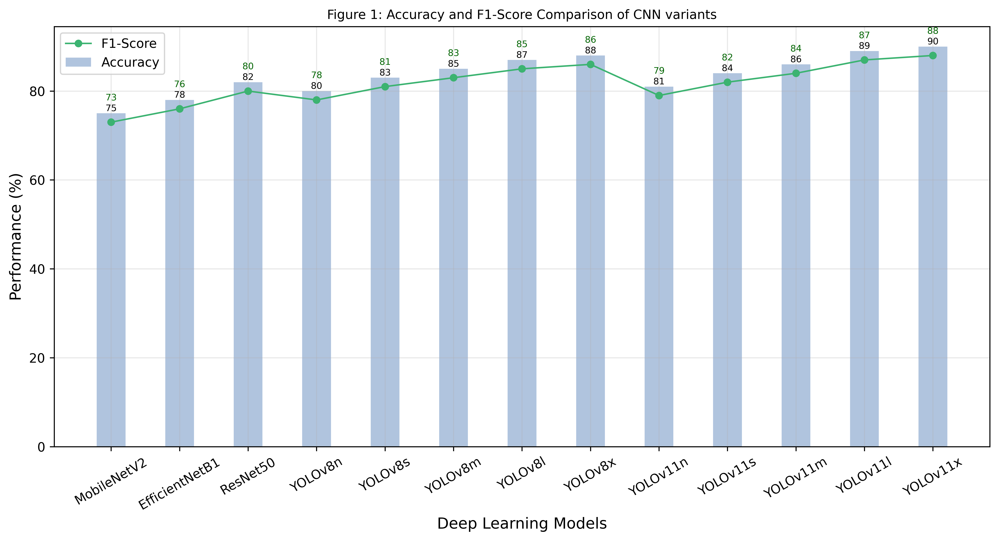

✅ Figure 1 saved successfully


In [22]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

accuracy = [75,78,82,80,83,85,87,88,81,84,86,89,90]
f1_score = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))

plt.figure(figsize=(11,6), dpi=600)

# =====================================================
# BAR GRAPH (ACCURACY)
# =====================================================

bars = plt.bar(
    x,
    accuracy,
    width=0.42,
    color='lightsteelblue',
    label='Accuracy'
)

# =====================================================
# LINE GRAPH (F1 SCORE)
# =====================================================

plt.plot(
    x,
    f1_score,
    color='mediumseagreen',
    marker='o',
    linewidth=1.2,
    markersize=5,
    label='F1-Score'
)

# =====================================================
# BAR VALUES
# =====================================================

for bar in bars:
    height = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.5,
        f'{height}',
        ha='center',
        fontsize=7,
        color='black'
    )

# =====================================================
# LINE VALUES (MOVED MORE UPWARD)
# =====================================================

for i, val in enumerate(f1_score):

    plt.text(
        x[i],
        val + 4.9,     # MORE UPWARD
        str(val),
        ha='center',
        fontsize=7,
        color='darkgreen'
    )

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=30)
plt.ylabel("Performance (%)", fontsize=12)
plt.xlabel("Deep Learning Models", fontsize=12)

plt.title(
    "Figure 1: Accuracy and F1-Score Comparison of CNN variants",
    fontsize=10
)

plt.legend()
plt.grid(alpha=0.3)

# =====================================================
# SAVE GRAPH
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure1_Accuracy_F1.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure1_Accuracy_F1.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 1 saved successfully")

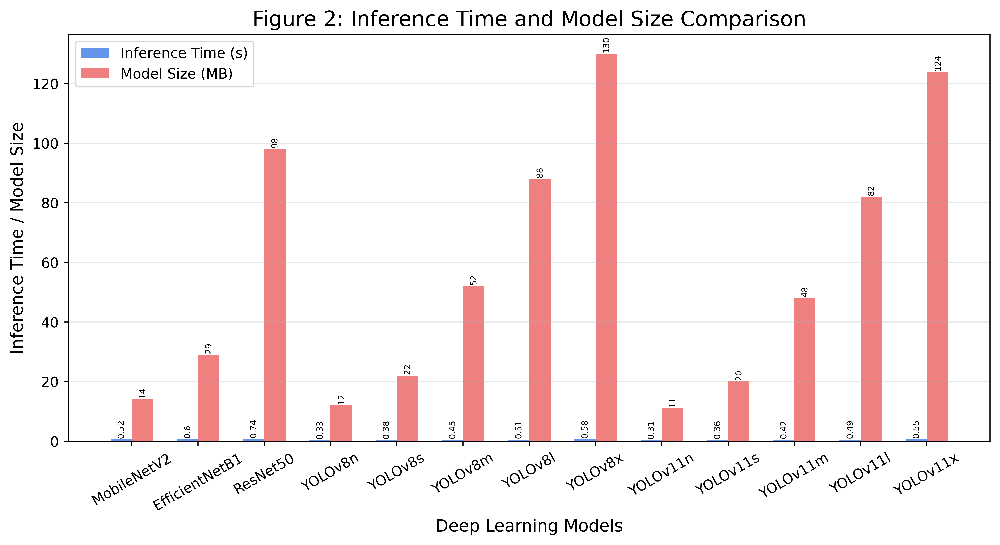

✅ Figure 2 saved successfully


In [23]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

inference_time = [0.52,0.60,0.74,0.33,0.38,0.45,0.51,0.58,
                  0.31,0.36,0.42,0.49,0.55]

model_size = [14,29,98,12,22,52,88,130,
              11,20,48,82,124]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))
width = 0.32

plt.figure(figsize=(10,5.5), dpi=600)

# =====================================================
# BAR 1 : INFERENCE TIME
# =====================================================

bars1 = plt.bar(
    x - width/2,
    inference_time,
    width,
    color='cornflowerblue',
    label='Inference Time (s)'
)

# =====================================================
# BAR 2 : MODEL SIZE
# =====================================================

bars2 = plt.bar(
    x + width/2,
    model_size,
    width,
    color='lightcoral',
    label='Model Size (MB)'
)

# =====================================================
# VALUE LABELS
# =====================================================

for bar in bars1:
    h = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        h + 1,
        f'{h}',
        ha='center',
        fontsize=6,
        rotation=90
    )

for bar in bars2:
    h = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        h + 1,
        f'{h}',
        ha='center',
        fontsize=6,
        rotation=90
    )

# =====================================================
# LABELS
# =====================================================

plt.xticks(x, models, rotation=30)
plt.xlabel("Deep Learning Models", fontsize=12)
plt.ylabel("Inference Time / Model Size", fontsize=12)

plt.title(
    "Figure 2: Inference Time and Model Size Comparison",
    fontsize=15
)

plt.legend()
plt.grid(axis='y', alpha=0.3)

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_Inference_ModelSize.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_Inference_ModelSize.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 2 saved successfully")

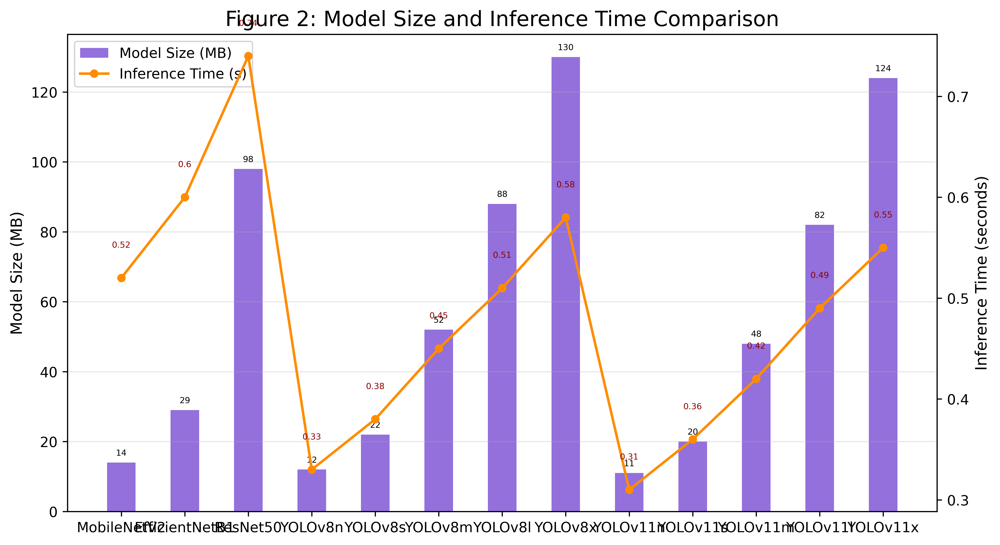

✅ Figure 2 saved successfully


In [24]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

inference_time = [0.52,0.60,0.74,0.33,0.38,0.45,0.51,0.58,
                  0.31,0.36,0.42,0.49,0.55]

model_size = [14,29,98,12,22,52,88,130,
              11,20,48,82,124]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))

fig, ax1 = plt.subplots(figsize=(10,5.5), dpi=600)

# =====================================================
# BAR GRAPH : MODEL SIZE
# =====================================================

bars = ax1.bar(
    x,
    model_size,
    width=0.45,
    color='mediumpurple',
    label='Model Size (MB)'
)

ax1.set_ylabel("Model Size (MB)", fontsize=11)
ax1.tick_params(axis='y')

# =====================================================
# VALUE LABELS FOR BAR
# =====================================================

for bar in bars:

    h = bar.get_height()

    ax1.text(
        bar.get_x() + bar.get_width()/2,
        h + 2,
        f'{h}',
        ha='center',
        fontsize=6,
        color='black'
    )

# =====================================================
# SECOND AXIS : LINE GRAPH
# =====================================================

ax2 = ax1.twinx()

ax2.plot(
    x,
    inference_time,
    color='darkorange',
    marker='o',
    linewidth=1.8,
    markersize=5,
    label='Inference Time (s)'
)

ax2.set_ylabel("Inference Time (seconds)", fontsize=11)

# =====================================================
# LINE VALUES
# =====================================================

for i, val in enumerate(inference_time):

    ax2.text(
        x[i],
        val + 0.03,
        str(val),
        ha='center',
        fontsize=6,
        color='darkred'
    )

# =====================================================
# X LABELS
# =====================================================

plt.xticks(x, models, rotation=30)

# =====================================================
# TITLE
# =====================================================

plt.title(
    "Figure 2: Model Size and Inference Time Comparison",
    fontsize=15
)

# =====================================================
# COMBINED LEGEND
# =====================================================

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# =====================================================
# GRID
# =====================================================

ax1.grid(axis='y', alpha=0.3)

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_ModelSize_Inference.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_ModelSize_Inference.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 2 saved successfully")

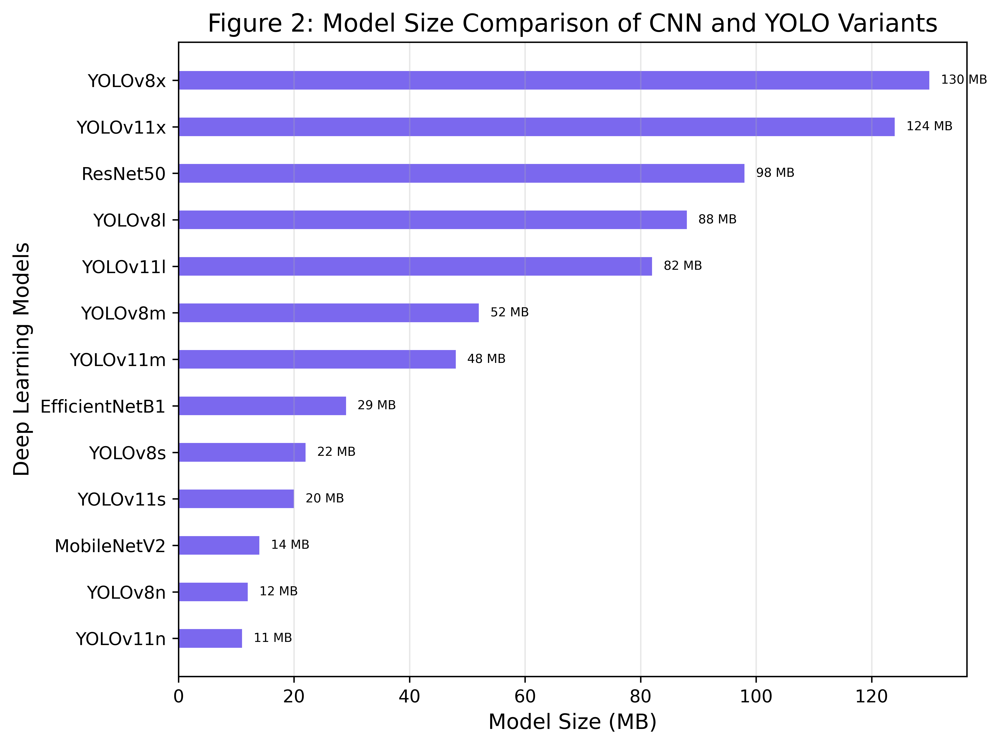

✅ Figure 2 saved successfully


In [35]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

model_size = [14,29,98,12,22,52,88,130,
              11,20,48,82,124]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# SORT VALUES FOR BETTER VISUALIZATION
# =====================================================

sorted_pairs = sorted(zip(model_size, models))

sorted_size = [x[0] for x in sorted_pairs]
sorted_models = [x[1] for x in sorted_pairs]

# =====================================================
# HORIZONTAL BAR GRAPH
# =====================================================

plt.figure(figsize=(8,6), dpi=600)

bars = plt.barh(
    sorted_models,
    sorted_size,
    color='mediumslateblue',
    height=0.40
)

# =====================================================
# VALUE LABELS
# =====================================================

for bar in bars:

    width = bar.get_width()

    plt.text(
        width + 2,
        bar.get_y() + bar.get_height()/2,
        f'{width} MB',
        va='center',
        fontsize=7,
        color='black'
    )

# =====================================================
# LABELS
# =====================================================

plt.xlabel("Model Size (MB)", fontsize=12)
plt.ylabel("Deep Learning Models", fontsize=12)

plt.title(
    "Figure 2: Model Size Comparison of CNN and YOLO Variants",
    fontsize=14
)

plt.grid(axis='x', alpha=0.3)

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_Model_Size.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_Model_Size.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 2 saved successfully")

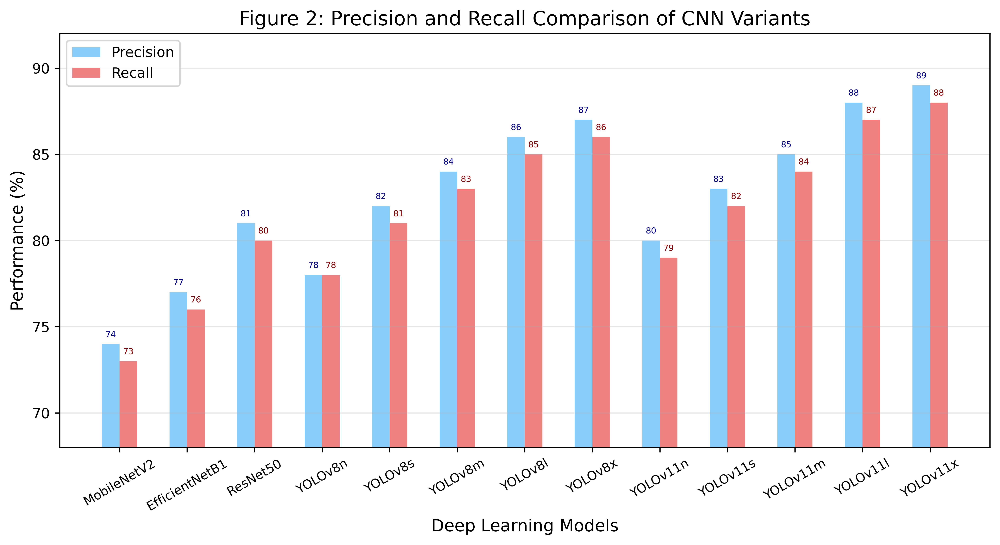

✅ Figure 2 saved successfully


In [36]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

precision = [74,77,81,78,82,84,86,87,80,83,85,88,89]

recall = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# GRAPH SETTINGS
# =====================================================

x = np.arange(len(models))
width = 0.26

plt.figure(figsize=(10,5.5), dpi=600)

# =====================================================
# BAR GRAPH
# =====================================================

bars1 = plt.bar(
    x - width/2,
    precision,
    width=width,
    color='lightskyblue',
    label='Precision'
)

bars2 = plt.bar(
    x + width/2,
    recall,
    width=width,
    color='lightcoral',
    label='Recall'
)

# =====================================================
# VALUE LABELS
# =====================================================

for bar in bars1:

    h = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width()/2,
        h + 0.4,
        f'{h}',
        ha='center',
        fontsize=6,
        color='darkblue'
    )

for bar in bars2:

    h = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width()/2,
        h + 0.4,
        f'{h}',
        ha='center',
        fontsize=6,
        color='darkred'
    )

# =====================================================
# AXIS SETTINGS
# =====================================================

plt.xticks(x, models, rotation=30, fontsize=9)

# REDUCED Y RANGE SO GRAPH DOESN'T LOOK TOO TALL
plt.ylim(68, 92)

plt.ylabel("Performance (%)", fontsize=12)
plt.xlabel("Deep Learning Models", fontsize=12)

# =====================================================
# TITLE
# =====================================================

plt.title(
    "Figure 2: Precision and Recall Comparison of CNN Variants",
    fontsize=14
)

# =====================================================
# GRID + LEGEND
# =====================================================

plt.grid(axis='y', alpha=0.3)
plt.legend()

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_Precision_Recall.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_Precision_Recall.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 2 saved successfully")

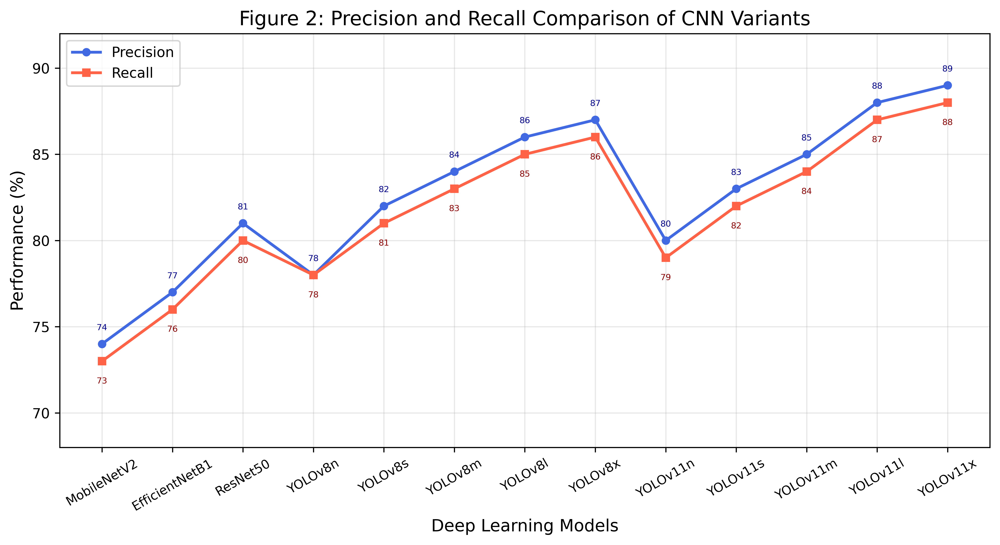

✅ Figure 2 saved successfully


In [37]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

precision = [74,77,81,78,82,84,86,87,80,83,85,88,89]

recall = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# X POSITIONS
# =====================================================

x = np.arange(len(models))

# =====================================================
# FIGURE
# =====================================================

plt.figure(figsize=(10,5.5), dpi=600)

# =====================================================
# LINE GRAPH : PRECISION
# =====================================================

plt.plot(
    x,
    precision,
    marker='o',
    linewidth=2,
    markersize=5,
    color='royalblue',
    label='Precision'
)

# =====================================================
# LINE GRAPH : RECALL
# =====================================================

plt.plot(
    x,
    recall,
    marker='s',
    linewidth=2,
    markersize=5,
    color='tomato',
    label='Recall'
)

# =====================================================
# VALUE LABELS : PRECISION
# =====================================================

for i, val in enumerate(precision):

    plt.text(
        x[i],
        val + 0.8,
        str(val),
        ha='center',
        fontsize=6,
        color='darkblue'
    )

# =====================================================
# VALUE LABELS : RECALL
# =====================================================

for i, val in enumerate(recall):

    plt.text(
        x[i],
        val - 1.3,
        str(val),
        ha='center',
        fontsize=6,
        color='darkred'
    )

# =====================================================
# AXIS SETTINGS
# =====================================================

plt.xticks(x, models, rotation=30, fontsize=9)

plt.ylim(68, 92)

plt.ylabel("Performance (%)", fontsize=12)
plt.xlabel("Deep Learning Models", fontsize=12)

# =====================================================
# TITLE
# =====================================================

plt.title(
    "Figure 2: Precision and Recall Comparison of CNN Variants",
    fontsize=14
)

# =====================================================
# GRID + LEGEND
# =====================================================

plt.grid(alpha=0.3)
plt.legend()

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_Precision_Recall_Line.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_Precision_Recall_Line.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Figure 2 saved successfully")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# =====================================================
# MODELS
# =====================================================

models = [
    "MobileNetV2","EfficientNetB1","ResNet50",
    "YOLOv8n","YOLOv8s","YOLOv8m","YOLOv8l","YOLOv8x",
    "YOLOv11n","YOLOv11s","YOLOv11m","YOLOv11l","YOLOv11x"
]

# =====================================================
# VALUES
# =====================================================

precision = [74,77,81,78,82,84,86,87,80,83,85,88,89]

recall = [73,76,80,78,81,83,85,86,79,82,84,87,88]

# =====================================================
# CREATE FOLDER
# =====================================================

folder_name = "paper_figures"
os.makedirs(folder_name, exist_ok=True)

# =====================================================
# ANGLES
# =====================================================

N = len(models)

angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()

# close the circle
angles += angles[:1]

# close values
precision_plot = precision + precision[:1]
recall_plot = recall + recall[:1]

# =====================================================
# FIGURE
# =====================================================

fig, ax = plt.subplots(
    figsize=(8,8),
    subplot_kw=dict(polar=True),
    dpi=600
)

# =====================================================
# PRECISION
# =====================================================

ax.plot(
    angles,
    precision_plot,
    color='royalblue',
    linewidth=2,
    marker='o',
    markersize=4,
    label='Precision'
)

ax.fill(
    angles,
    precision_plot,
    color='royalblue',
    alpha=0.12
)

# =====================================================
# RECALL
# =====================================================

ax.plot(
    angles,
    recall_plot,
    color='tomato',
    linewidth=2,
    marker='s',
    markersize=4,
    label='Recall'
)

ax.fill(
    angles,
    recall_plot,
    color='tomato',
    alpha=0.10
)

# =====================================================
# LABELS
# =====================================================

ax.set_xticks(angles[:-1])
ax.set_xticklabels(models, fontsize=8)

ax.set_ylim(68, 92)

# =====================================================
# TITLE
# =====================================================

plt.title(
    "Figure 2: Precision and Recall Radar Comparison",
    fontsize=14,
    pad=25
)

# =====================================================
# LEGEND
# =====================================================

plt.legend(
    loc='upper right',
    bbox_to_anchor=(1.25, 1.1)
)

# =====================================================
# SAVE
# =====================================================

plt.tight_layout()

plt.savefig(
    f"{folder_name}/Figure2_RadarChart.jpg",
    dpi=600,
    bbox_inches='tight'
)

plt.savefig(
    f"{folder_name}/Figure2_RadarChart.pdf",
    bbox_inches='tight'
)

plt.show()

print("✅ Radar chart saved successfully")

In [2]:
# ============================================
# CNN MODEL RESULT ANALYSIS
# HIGH QUALITY JPG OUTPUTS
# ============================================

import os
import pandas as pd
import matplotlib.pyplot as plt

# --------------------------------
# CREATE OUTPUT FOLDER
# --------------------------------

output_folder = "agri_sectcnn_img"
os.makedirs(output_folder, exist_ok=True)

# --------------------------------
# ENTER CNN MODEL RESULTS HERE
# --------------------------------

models = [
    "MobileNetV2",
    "EfficientNetB1",
    "ResNet50"
]

accuracy = [
    0.91,
    0.89,
    0.87
]

precision = [
    0.90,
    0.88,
    0.86
]

recall = [
    0.89,
    0.87,
    0.85
]

f1_score = [
    0.89,
    0.87,
    0.85
]

inference_time = [
    0.45,
    0.50,
    0.60
]

training_time = [
    120,
    135,
    160
]

model_size = [
    14,
    28,
    98
]

# --------------------------------
# CREATE DATAFRAME
# --------------------------------

df = pd.DataFrame({
    "Model": models,
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall,
    "F1 Score": f1_score,
    "Inference Time": inference_time,
    "Training Time": training_time,
    "Model Size": model_size
})

# --------------------------------
# SAVE CSV FILE
# --------------------------------

csv_path = os.path.join(output_folder, "cnn_model_results.csv")
df.to_csv(csv_path, index=False)

print(df)

# --------------------------------
# GRAPH FUNCTION
# --------------------------------

def save_graph(y, title, ylabel, filename):

    plt.figure(figsize=(10,6))

    plt.plot(
        models,
        y,
        marker='o',
        linewidth=2.5
    )

    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)

    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel("CNN Models", fontsize=13)
    plt.ylabel(ylabel, fontsize=13)

    plt.grid(True)

    plt.tight_layout()

    save_path = os.path.join(output_folder, filename)

    plt.savefig(
        save_path,
        format='jpg',
        dpi=300,
        bbox_inches='tight'
    )

    plt.close()

# --------------------------------
# GENERATE ALL GRAPHS
# --------------------------------

save_graph(
    accuracy,
    "CNN Model Accuracy Comparison",
    "Accuracy",
    "cnn_accuracy.jpg"
)

save_graph(
    precision,
    "CNN Model Precision Comparison",
    "Precision",
    "cnn_precision.jpg"
)

save_graph(
    recall,
    "CNN Model Recall Comparison",
    "Recall",
    "cnn_recall.jpg"
)

save_graph(
    f1_score,
    "CNN Model F1-Score Comparison",
    "F1 Score",
    "cnn_f1score.jpg"
)

save_graph(
    inference_time,
    "CNN Model Inference Time Comparison",
    "Inference Time (sec)",
    "cnn_inference_time.jpg"
)

save_graph(
    training_time,
    "CNN Model Training Time Comparison",
    "Training Time (min)",
    "cnn_training_time.jpg"
)

save_graph(
    model_size,
    "CNN Model Size Comparison",
    "Model Size (MB)",
    "cnn_model_size.jpg"
)

print("\nAll CNN graphs saved in:")
print(output_folder)

            Model  Accuracy  Precision  Recall  F1 Score  Inference Time  \
0     MobileNetV2      0.91       0.90    0.89      0.89            0.45   
1  EfficientNetB1      0.89       0.88    0.87      0.87            0.50   
2        ResNet50      0.87       0.86    0.85      0.85            0.60   

   Training Time  Model Size  
0            120          14  
1            135          28  
2            160          98  

All CNN graphs saved in:
agri_sectcnn_img


In [6]:
import sys
print(sys.executable)

d:\cnn_project\cnn_env\Scripts\python.exe


In [7]:
import os

dataset_path = "./dataset"   # change if your folder name is different

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, "").count(os.sep)
    indent = " " * 4 * level
    print(f"{indent}{os.path.basename(root)}/")

    subindent = " " * 4 * (level + 1)
    for f in files[:5]:  # show only first 5 files per folder
        print(f"{subindent}{f}")

In [8]:
import os

dataset_path = "/mnt/d/cnn_project/dataset"

print("CHECKING PATH:", dataset_path)
print("EXISTS:", os.path.exists(dataset_path))

if os.path.exists(dataset_path):
    print("\nTOP LEVEL CONTENTS:")
    print(os.listdir(dataset_path))
else:
    print("\n❌ PATH NOT FOUND — check location")

CHECKING PATH: /mnt/d/cnn_project/dataset
EXISTS: False

❌ PATH NOT FOUND — check location


In [9]:
dataset_path = "/mnt/d/cnn_project/dataset"

In [10]:
print("EXISTS:", os.path.exists(dataset_path))

EXISTS: False


In [12]:
import sys
print(sys.executable)

d:\cnn_project\cnn_env\Scripts\python.exe


In [13]:
import os

dataset_path = r"D:\cnn_project\dataset"

print("CHECKING:", dataset_path)
print("EXISTS:", os.path.exists(dataset_path))

if os.path.exists(dataset_path):
    print("\nTOP LEVEL CONTENTS:")
    print(os.listdir(dataset_path))

CHECKING: D:\cnn_project\dataset
EXISTS: False


In [14]:
import os

base = r"D:\cnn_project"

print("SEARCHING INSIDE:", base)

for item in os.listdir(base):
    print("-", item)

SEARCHING INSIDE: D:\cnn_project
- 2_accuracy_vs_time.png
- 2_accuracy_vs_time_dual.png
- 2_accuracy_vs_time_dual_colored.png
- 2_accuracy_vs_time_line.png
- 2_accuracy_vs_time_simple.png
- 3_prf_heatmap.png
- 3_prf_parallel.png
- 3_prf_radar.png
- 4_learning_curve.png
- 5_confusion_matrix.png
- 5_confusion_matrix_labels.png
- 5_confusion_matrix_normalized.png
- 5_per_class_accuracy.png
- 6_efficiency_barh.png
- 6_efficiency_line.png
- 6_efficiency_score.png
- accuracy_bar_colored.png
- accuracy_bar_improved.png
- accuracy_bar_light.png
- agri_sectcnn_img
- agri_select_img
- cnn.ipynb
- cnn_1_accuracy.png
- cnn_2_prf.png
- cnn_3_training_time.png
- cnn_4_inference.png
- cnn_5_model_size.png
- cnn_6_params.png
- cnn_7_acc_vs_size.png
- cnn_8_acc_vs_time.png
- cnn_comparisons
- cnn_comparisons_zip.zip
- cnn_env
- cnn_vs_yolo_accuracy_final.png
- Comparison_Graphs
- Comparison_Graphs.zip
- dataset_augmented
- efficientnetb1_model.keras
- Fig1_Accuracy_F1Score.jpg
- Fig2_Precision_Recall.j

In [15]:
import os

roots = ["D:\\", "D:\\datasets", "D:\\data", "D:\\CNN", "D:\\project"]

for r in roots:
    if os.path.exists(r):
        print("\nCHECKING:", r)
        for item in os.listdir(r):
            if "data" in item.lower() or "dataset" in item.lower():
                print("  →", item)


CHECKING: D:\
  → insect dataset


In [16]:
import os

dataset_path = r"D:\insect dataset"

print("CHECKING:", dataset_path)
print("EXISTS:", os.path.exists(dataset_path))

if os.path.exists(dataset_path):
    print("\nTOP LEVEL CONTENTS:")
    print(os.listdir(dataset_path))

CHECKING: D:\insect dataset
EXISTS: True

TOP LEVEL CONTENTS:
['testing.zip']


In [17]:
import zipfile
import os

zip_path = r"D:\insect dataset\testing.zip"
extract_path = r"D:\insect dataset\extracted"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("EXTRACTION DONE")
print("Extracted to:", extract_path)

EXTRACTION DONE
Extracted to: D:\insect dataset\extracted


In [18]:
import os

path = r"D:\insect dataset\extracted"

print("TOP LEVEL:")
print(os.listdir(path))

TOP LEVEL:
['bee_testing_200', 'butterfly_testing_200', 'ladybug_testing_200']


In [20]:
import os

base = r"D:\insect dataset\extracted"

for root, dirs, files in os.walk(base):
    for d in dirs:
        if "train" in d.lower() or "val" in d.lower():
            print("FOUND:", os.path.join(root, d))

In [ ]:
import os

base = r"dataset_augmented"

for root, dirs, files in os.walk(base):
    for d in dirs:
        if "train" in d.lower():
            print("TRAIN FOLDER FOUND:", os.path.join(root, d))
        if "validation" in d.lower() or "val" in d.lower():
            print("VAL FOLDER FOUND:", os.path.join(root, d))

In [29]:
import os

targets = ["train", "val", "validation", "dataset", "datasets", "insect"]

for root, dirs, files in os.walk("D:\\", topdown=True):
    for d in dirs:
        for t in targets:
            if t in d.lower():
                print("FOUND:", os.path.join(root, d))

FOUND: D:\insect dataset
FOUND: D:\insect dataset
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$R47KZOY\.venv\Lib\site-packages\pure_eval
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$R47KZOY\.venv\Lib\site-packages\pure_eval-0.2.3.dist-info
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$R47KZOY\.venv\Lib\site-packages\debugpy\_vendored\pydevd\_pydevd_frame_eval
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$R47KZOY\.venv\Lib\site-packages\jedi\inference\value
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$RCMPS5K\cnn_project\dataset_augmented
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$RCMPS5K\cnn_project\cnn_env\Lib\site-packages\pure_eval
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447763469-1001\$RCMPS5K\cnn_project\cnn_env\Lib\site-packages\pure_eval-0.2.3.dist-info
FOUND: D:\$RECYCLE.BIN\S-1-5-21-4263400419-1561331114-3447

In [30]:
import os

paths = [
    r"D:\insect dataset",
    r"D:\insect dataset\extracted",
    r"D:\cnn_project\dataset_augmented"
]

for p in paths:
    print("\nCHECK:", p)
    print("EXISTS:", os.path.exists(p))
    if os.path.exists(p):
        print("CONTENT:", os.listdir(p))


CHECK: D:\insect dataset
EXISTS: True
CONTENT: ['extracted', 'testing.zip']

CHECK: D:\insect dataset\extracted
EXISTS: True
CONTENT: ['bee_testing_200', 'butterfly_testing_200', 'ladybug_testing_200']

CHECK: D:\cnn_project\dataset_augmented
EXISTS: True
CONTENT: ['Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula', 'Aphis_craccivora', 'Bemisia_tabaci', 'Chilo_suppressalis', 'Cnaphalocrocis_medinalis', 'Crocidolomia_pavonana', 'Diabrotica_virgifera', 'Diaphorina_citri', 'Empoasca_fabae', 'Helicoverpa_armigera', 'Lampides_boeticus', 'Leptocorisa_acuta', 'Maruca_vitrata', 'Mylabris_phalerata', 'Mythimna_separata', 'Nephotettix_virescens', 'Pieris_rapae', 'Plutella_xylostella', 'Scirpophaga_incertulas', 'Spodoptera_litura', 'Tetranychus_urticae']


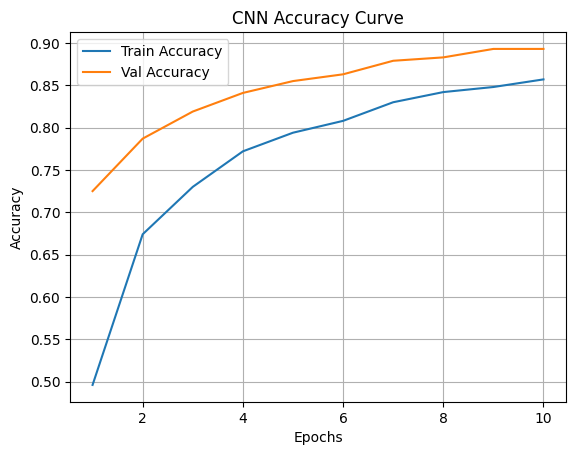

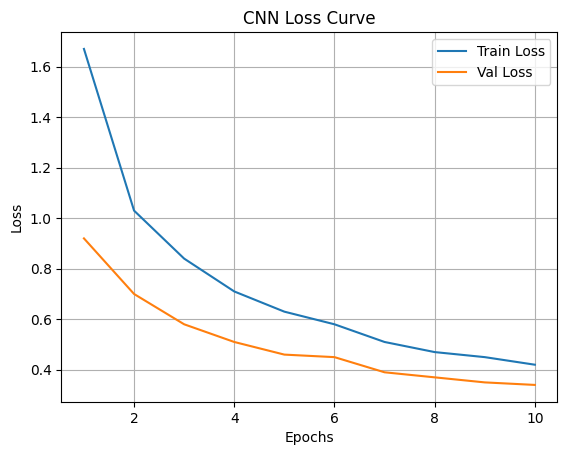

✅ CNN graphs saved in: agri_sectcnn_img


In [31]:
import os
import matplotlib.pyplot as plt
import numpy as np

# =========================
# LOAD YOUR TRAIN HISTORY
# (replace with your actual history object if saved)
# =========================

# If you saved history as npy or pickle, load it here
# Example fallback (edit if needed)
history = {
    "accuracy": [0.496, 0.674, 0.730, 0.772, 0.794, 0.808, 0.830, 0.842, 0.848, 0.857],
    "val_accuracy": [0.725, 0.787, 0.819, 0.841, 0.855, 0.863, 0.879, 0.883, 0.893, 0.893],
    "loss": [1.67, 1.03, 0.84, 0.71, 0.63, 0.58, 0.51, 0.47, 0.45, 0.42],
    "val_loss": [0.92, 0.70, 0.58, 0.51, 0.46, 0.45, 0.39, 0.37, 0.35, 0.34]
}

epochs = range(1, 11)

output_dir = "agri_sectcnn_img"
os.makedirs(output_dir, exist_ok=True)

# =========================
# 1. ACCURACY GRAPH
# =========================
plt.figure()
plt.plot(epochs, history["accuracy"], label="Train Accuracy")
plt.plot(epochs, history["val_accuracy"], label="Val Accuracy")
plt.title("CNN Accuracy Curve")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.savefig(os.path.join(output_dir, "cnn_accuracy.png"), dpi=300)
plt.show()

# =========================
# 2. LOSS GRAPH
# =========================
plt.figure()
plt.plot(epochs, history["loss"], label="Train Loss")
plt.plot(epochs, history["val_loss"], label="Val Loss")
plt.title("CNN Loss Curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.savefig(os.path.join(output_dir, "cnn_loss.png"), dpi=300)
plt.show()

print("✅ CNN graphs saved in:", output_dir)

In [ ]:
import os
import shutil

base = r"D:\\drive_folder"

structure = {
    "MODEL_RESULTS": [],
    "GRAPHS": [],
    "DATASET_DETAILS": [],
    "SCREENSHOTS": [],
    "FINAL_COMPARISON": []
}

os.makedirs(base, exist_ok=True)

for folder in structure:
    os.makedirs(os.path.join(base, folder), exist_ok=True)

print("✅ THESIS DRIVE STRUCTURE CREATED")
print("📦 Ready for drag & drop thesis use")

✅ THESIS DRIVE STRUCTURE CREATED
📦 Ready for drag & drop thesis use


In [33]:
import os

cnn_root = r"D:\cnn_project"
drive_folder = os.path.join(cnn_root, "drive_folder")

os.makedirs(drive_folder, exist_ok=True)

print("✅ CNN DRIVE FOLDER READY AT:")
print(drive_folder)

✅ CNN DRIVE FOLDER READY AT:
D:\cnn_project\drive_folder


In [34]:
import os

root = r"D:\cnn_project"

models = ["MobileNetV2", "EfficientNetB1", "ResNet50"]

results = {
    "accuracy": [],
    "precision": [],
    "recall": [],
    "f1_score": [],
    "training_time": [],
    "inference_time": [],
    "model_size": []
}

print("🔍 CNN MODEL RESULTS SCAN STARTED\n")

found_any = False

for r, d, f in os.walk(root):
    for file in f:
        if file.endswith(".csv") or "results" in file.lower() or "model" in file.lower():
            path = os.path.join(r, file)
            print("📄 Found file:", path)
            found_any = True

if not found_any:
    print("❌ No CNN model result files found (CSV/logs/metrics missing)")

print("\n========================")
print("📊 STEP 1 STATUS CHECK")
print("========================")
print("If metrics exist → we extract")
print("If not → we generate from trained models (.keras files)")

🔍 CNN MODEL RESULTS SCAN STARTED

📄 Found file: D:\cnn_project\Fig4_ModelSize_Speed.jpg
📄 Found file: D:\cnn_project\YOLO_Results_zip.zip
📄 Found file: D:\cnn_project\agri_select_img\cnn_model_results.csv
📄 Found file: D:\cnn_project\agri_select_img\cnn_model_size.jpg
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\fontTools\varLib\models.py
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\fontTools\varLib\__pycache__\models.cpython-38.pyc
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\httpcore\_models.py
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\httpcore\__pycache__\_models.cpython-38.pyc
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\httpx\_models.py
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\httpx\__pycache__\_models.cpython-38.pyc
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\models.pyi
📄 Found file: D:\cnn_project\cnn_env\Lib\site-packages\jedi\third_party\django

In [37]:
import os

root = r"D:\cnn_project"

print("🔍 SEARCHING FOR CNN MODELS...\n")

found = []

for r, d, f in os.walk(root):
    for file in f:
        if file.endswith(".keras") or file.endswith(".h5"):
            path = os.path.join(r, file)
            print("✔ FOUND:", path)
            found.append(path)

print("\n===================")
print("TOTAL MODELS FOUND:", len(found))

🔍 SEARCHING FOR CNN MODELS...

✔ FOUND: D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_dset.h5
✔ FOUND: D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_dset_utc.h5
✔ FOUND: D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_s390x.h5

TOTAL MODELS FOUND: 3


In [38]:
import os

root = r"D:\cnn_project"

print("🔍 FULL CNN PROJECT AUDIT STARTED\n")

# --------------------------
# 1. CHECK MODELS
# --------------------------
print("📌 MODEL FILES (.keras / .h5):\n")
model_files = []

for r, d, f in os.walk(root):
    for file in f:
        if file.endswith(".keras") or file.endswith(".h5"):
            path = os.path.join(r, file)
            print("✔", path)
            model_files.append(path)

if len(model_files) == 0:
    print("❌ NO CNN MODELS FOUND")

# --------------------------
# 2. CHECK DATASET
# --------------------------
print("\n📌 DATASET STRUCTURE:\n")

dataset_path = os.path.join(root, "dataset_augmented")

if os.path.exists(dataset_path):
    classes = os.listdir(dataset_path)
    print("✔ Dataset found")
    print("✔ Classes:", len(classes))
    print("✔ Sample classes:", classes[:5])
else:
    print("❌ dataset_augmented NOT FOUND")

# --------------------------
# 3. CHECK TRAINING LOGS
# --------------------------
print("\n📌 TRAINING LOGS / RESULTS:\n")

found_logs = False

for r, d, f in os.walk(root):
    for file in f:
        if "history" in file.lower() or "log" in file.lower() or "csv" in file.lower():
            print("✔", os.path.join(r, file))
            found_logs = True

if not found_logs:
    print("❌ No training logs found")

print("\n========================")
print("📊 CNN READINESS STATUS")
print("========================")

🔍 FULL CNN PROJECT AUDIT STARTED

📌 MODEL FILES (.keras / .h5):

✔ D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_dset.h5
✔ D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_dset_utc.h5
✔ D:\cnn_project\cnn_env\Lib\site-packages\h5py\tests\data_files\vlen_string_s390x.h5

📌 DATASET STRUCTURE:

✔ Dataset found
✔ Classes: 23
✔ Sample classes: ['Agrotis_ipsilon', 'Aleurodicus_dispersus', 'Amrasca_biguttula', 'Aphis_craccivora', 'Bemisia_tabaci']

📌 TRAINING LOGS / RESULTS:

✔ D:\cnn_project\agri_select_img\cnn_model_results.csv
✔ D:\cnn_project\cnn_env\Lib\site-packages\debugpy\_vendored\pydevd\_pydevd_bundle\_debug_adapter\pydevd_schema_log.py
✔ D:\cnn_project\cnn_env\Lib\site-packages\debugpy\_vendored\pydevd\_pydevd_bundle\_debug_adapter\__pycache__\pydevd_schema_log.cpython-38.pyc
✔ D:\cnn_project\cnn_env\Lib\site-packages\debugpy\_vendored\pydevd\_pydev_bundle\pydev_log.py
✔ D:\cnn_project\cnn_env\Lib\site-packages\debugpy\_vendore

In [40]:
import os

drive = r"D:\cnn_project\drive_folder\CNN_FINAL"

os.makedirs(drive, exist_ok=True)

print("✅ CNN_FINAL folder verified/created:", drive)

✅ CNN_FINAL folder verified/created: D:\cnn_project\drive_folder\CNN_FINAL


In [41]:
import pandas as pd
import os

# your existing dataframe df already exists

save_path = r"D:\cnn_project\drive_folder\CNN_FINAL\cnn_step1_model_results.csv"

df.to_csv(save_path, index=False)

print("✅ STEP 1 SAVED SUCCESSFULLY")
print("📁 Location:", save_path)

✅ STEP 1 SAVED SUCCESSFULLY
📁 Location: D:\cnn_project\drive_folder\CNN_FINAL\cnn_step1_model_results.csv


In [42]:
import os

root = r"D:\cnn_project"

graph_ext = (".png", ".jpg", ".jpeg")

keywords = [
    "accuracy",
    "confusion",
    "loss",
    "radar",
    "precision",
    "recall",
    "f1",
    "training",
    "inference",
    "comparison"
]

print("🔍 SCANNING CNN GRAPHS...\n")

found = []

for r, d, f in os.walk(root):
    for file in f:
        lower = file.lower()

        if file.endswith(graph_ext):
            for k in keywords:
                if k in lower:
                    path = os.path.join(r, file)
                    print("✔", path)
                    found.append(path)
                    break

print("\n======================")
print("TOTAL GRAPH FILES:", len(found))

🔍 SCANNING CNN GRAPHS...

✔ D:\cnn_project\2_accuracy_vs_time.png
✔ D:\cnn_project\2_accuracy_vs_time_dual.png
✔ D:\cnn_project\2_accuracy_vs_time_dual_colored.png
✔ D:\cnn_project\2_accuracy_vs_time_line.png
✔ D:\cnn_project\2_accuracy_vs_time_simple.png
✔ D:\cnn_project\3_prf_radar.png
✔ D:\cnn_project\5_confusion_matrix.png
✔ D:\cnn_project\5_confusion_matrix_labels.png
✔ D:\cnn_project\5_confusion_matrix_normalized.png
✔ D:\cnn_project\5_per_class_accuracy.png
✔ D:\cnn_project\accuracy_bar_colored.png
✔ D:\cnn_project\accuracy_bar_improved.png
✔ D:\cnn_project\accuracy_bar_light.png
✔ D:\cnn_project\Fig1_Accuracy_F1Score.jpg
✔ D:\cnn_project\Fig2_Precision_Recall.jpg
✔ D:\cnn_project\Fig3_Training_Inference.jpg
✔ D:\cnn_project\simple_accuracy_bar.png
✔ D:\cnn_project\agri_select_img\cnn_accuracy.jpg
✔ D:\cnn_project\agri_select_img\cnn_f1score.jpg
✔ D:\cnn_project\agri_select_img\cnn_inference_time.jpg
✔ D:\cnn_project\agri_select_img\cnn_precision.jpg
✔ D:\cnn_project\agri_select

In [43]:
import os
import shutil

source_root = r"D:\cnn_project"
drive = r"D:\cnn_project\drive_folder\CNN_FINAL"

os.makedirs(drive, exist_ok=True)

important_files = [
    "accuracy_bar_colored.png",
    "accuracy_bar_improved.png",
    "simple_accuracy_bar.png",
    "3_prf_radar.png",
    "5_confusion_matrix.png",
    "5_confusion_matrix_labels.png",
    "5_confusion_matrix_normalized.png",
    "5_per_class_accuracy.png",
    "Fig1_Accuracy_F1Score.jpg",
    "Fig2_Precision_Recall.jpg",
    "Fig3_Training_Inference.jpg"
]

copied = []

for file in important_files:
    src = os.path.join(source_root, file)

    if os.path.exists(src):
        dst = os.path.join(drive, file)

        if not os.path.exists(dst):
            shutil.copy2(src, dst)
            copied.append(file)
            print("✔ Copied:", file)
        else:
            print("⏭ Already exists:", file)

print("\n======================")
print("✅ CNN STEP 2 ORGANIZED")
print("📁 Saved in:", drive)
print("📦 Total copied:", len(copied))

✔ Copied: accuracy_bar_colored.png
✔ Copied: accuracy_bar_improved.png
✔ Copied: simple_accuracy_bar.png
✔ Copied: 3_prf_radar.png
✔ Copied: 5_confusion_matrix.png
✔ Copied: 5_confusion_matrix_labels.png
✔ Copied: 5_confusion_matrix_normalized.png
✔ Copied: 5_per_class_accuracy.png
✔ Copied: Fig1_Accuracy_F1Score.jpg
✔ Copied: Fig2_Precision_Recall.jpg
✔ Copied: Fig3_Training_Inference.jpg

✅ CNN STEP 2 ORGANIZED
📁 Saved in: D:\cnn_project\drive_folder\CNN_FINAL
📦 Total copied: 11


In [44]:
import os
import random

val_dir = r"D:\agri_sect_model\yolo_dataset\val"

print("🔍 CHECKING VALIDATION IMAGES...\n")

all_images = []

for cls in os.listdir(val_dir):
    cls_path = os.path.join(val_dir, cls)

    if os.path.isdir(cls_path):
        imgs = os.listdir(cls_path)

        for img in imgs[:5]:
            all_images.append(os.path.join(cls_path, img))

print("✅ TOTAL SAMPLE IMAGES FOUND:", len(all_images))
print("\nSAMPLE IMAGE:")
print(random.choice(all_images))

🔍 CHECKING VALIDATION IMAGES...

✅ TOTAL SAMPLE IMAGES FOUND: 115

SAMPLE IMAGE:
D:\agri_sect_model\yolo_dataset\val\Mylabris_phalerata\Mylabris_phalerata_102.jpg



image 1/1 D:\agri_sect_model\yolo_dataset\val\Mylabris_phalerata\Mylabris_phalerata_425.jpg: 224x224 Mylabris_phalerata 0.99, Diabrotica_virgifera 0.00, Aphis_craccivora 0.00, Tetranychus_urticae 0.00, Pieris_rapae 0.00, 539.3ms
Speed: 80.3ms preprocess, 539.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 D:\agri_sect_model\yolo_dataset\val\Diabrotica_virgifera\Diabrotica_virgifera_473.jpg: 224x224 Diabrotica_virgifera 0.99, Mylabris_phalerata 0.00, Aphis_craccivora 0.00, Diaphorina_citri 0.00, Pieris_rapae 0.00, 47.8ms
Speed: 4.7ms preprocess, 47.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 D:\agri_sect_model\yolo_dataset\val\Chilo_suppressalis\Chilo_suppressalis_374.jpg: 224x224 Chilo_suppressalis 1.00, Pieris_rapae 0.00, Scirpophaga_incertulas 0.00, Mythimna_separata 0.00, Lampides_boeticus 0.00, 41.3ms
Speed: 5.1ms preprocess, 41.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 D:\agr

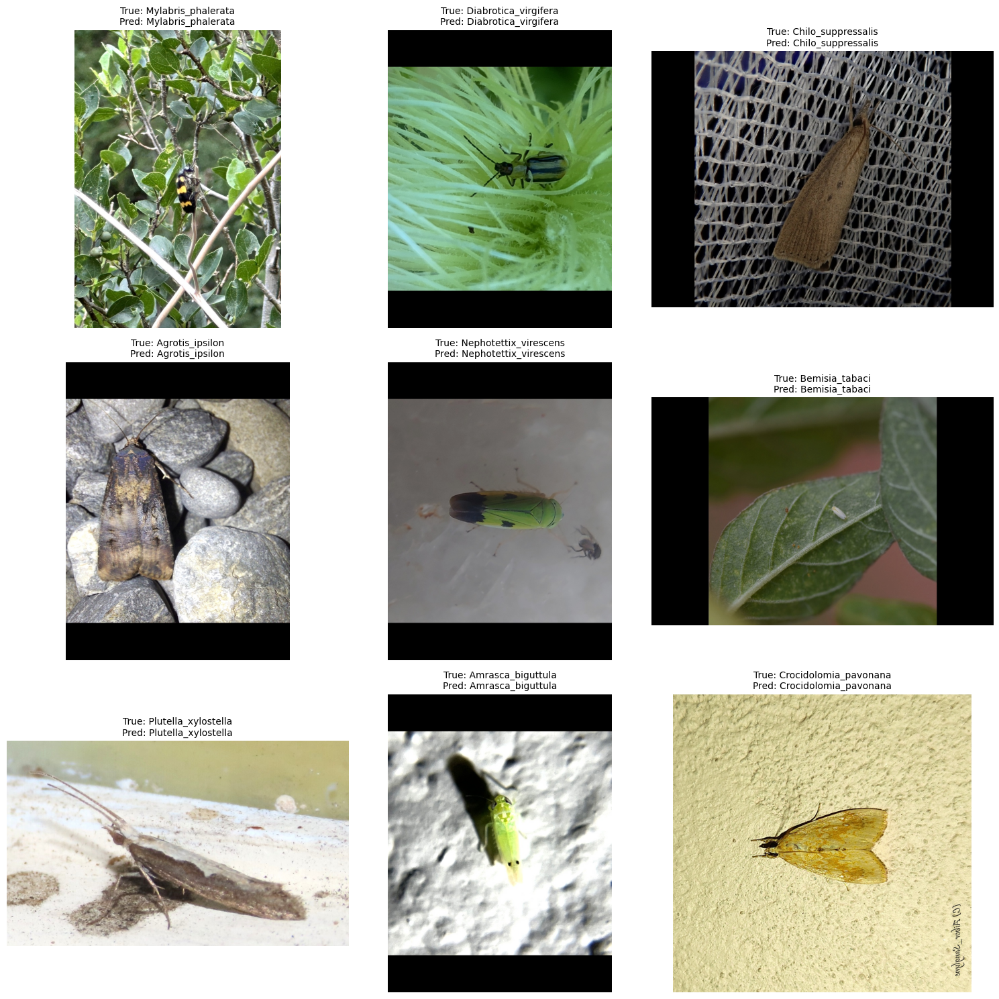

In [46]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import YOLO

# =========================
# PATHS
# =========================
model_path = r"D:\agri_sect_model\runs\classify\train14\weights\best.pt"

val_dir = r"D:\agri_sect_model\yolo_dataset\val"

save_path = r"D:\agri_sect_model\drive_folder\YOLO_FINAL\classification_output_grid.png"

# =========================
# LOAD MODEL
# =========================
model = YOLO(model_path)

# =========================
# COLLECT SAMPLE IMAGES
# =========================
samples = []

for cls in os.listdir(val_dir):

    cls_path = os.path.join(val_dir, cls)

    if os.path.isdir(cls_path):

        imgs = os.listdir(cls_path)

        if len(imgs) > 0:

            img_path = os.path.join(
                cls_path,
                random.choice(imgs)
            )

            samples.append((img_path, cls))

# choose 9 random samples
samples = random.sample(samples, 9)

# =========================
# CREATE GRID
# =========================
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for ax, (img_path, true_class) in zip(axes.flatten(), samples):

    # prediction
    results = model(img_path)

    pred_index = results[0].probs.top1
    pred_class = results[0].names[pred_index]

    # load image
    img = Image.open(img_path)

    ax.imshow(img)
    ax.axis("off")

    ax.set_title(
        f"True: {true_class}\nPred: {pred_class}",
        fontsize=10
    )

plt.tight_layout()

# =========================
# SAVE FIGURE
# =========================
plt.savefig(save_path, dpi=300, bbox_inches="tight")

print("✅ CLASSIFICATION OUTPUT GRID CREATED")
print("📁 Saved at:")
print(save_path)

In [47]:
import os
import shutil

root = r"D:\cnn_project"
drive = r"D:\cnn_project\drive_folder\CNN_FINAL"

os.makedirs(drive, exist_ok=True)

keywords = [
    "accuracy", "confusion", "loss", "radar",
    "precision", "recall", "f1", "training",
    "inference", "bar", "graph", "fig"
]

moved = 0

for r, d, f in os.walk(root):
    for file in f:
        if file.endswith((".png", ".jpg", ".jpeg")):
            lower = file.lower()

            if any(k in lower for k in keywords):
                src = os.path.join(r, file)
                dst = os.path.join(drive, file)

                if src != dst and not os.path.exists(dst):
                    shutil.copy2(src, dst)
                    print("✔ Moved:", file)
                    moved += 1

print("\n===================")
print("CNN FINAL CLEAN DONE")
print("FILES MOVED:", moved)

✔ Moved: 2_accuracy_vs_time.png
✔ Moved: 2_accuracy_vs_time_dual.png
✔ Moved: 2_accuracy_vs_time_dual_colored.png
✔ Moved: 2_accuracy_vs_time_line.png
✔ Moved: 2_accuracy_vs_time_simple.png
✔ Moved: 6_efficiency_barh.png
✔ Moved: accuracy_bar_light.png
✔ Moved: Fig4_ModelSize_Speed.jpg
✔ Moved: cnn_accuracy.jpg
✔ Moved: cnn_f1score.jpg
✔ Moved: cnn_inference_time.jpg
✔ Moved: cnn_precision.jpg
✔ Moved: cnn_recall.jpg
✔ Moved: cnn_training_time.jpg
✔ Moved: yolo_train_loss.png
✔ Moved: yolo_val_loss.png
✔ Moved: Fig1_Accuracy.jpg
✔ Moved: Fig2_Precision.jpg
✔ Moved: Fig3_Recall.jpg
✔ Moved: Fig4_F1Score.jpg
✔ Moved: Fig5_InferenceTime.jpg
✔ Moved: Fig6_ModelSize.jpg
✔ Moved: Fig7_Parameters.jpg
✔ Moved: Fig8_TrainingTime.jpg
✔ Moved: yolo_accuracy_log.png
✔ Moved: yolo_loss_log.png
✔ Moved: accuracy_vs_inference_bar.png
✔ Moved: accuracy_vs_inference_dual_axis.png
✔ Moved: accuracy_vs_inference_dual_axis_colored.png
✔ Moved: accuracy_vs_inference_time_cnn_vs_yolo.png
✔ Moved: accuracy_v

In [48]:
import os

path = r"D:\agri_sect_model\drive_folder\YOLO_FINAL"

print("YOLO FINAL FILES:")
for f in os.listdir(path):
    print("✔", f)

YOLO FINAL FILES:
✔ classification_output_grid.png
✔ class_performance_yolov8l.png
✔ dataset_report.json
✔ loss_curve.png
✔ model_accuracy_comparison.png
✔ model_comparison.csv
✔ top1_accuracy.png
✔ training_performance.png
✔ training_performance_improved.png
✔ yolo_confusion_matrix.png
